# Mental Health in the Tech Industry
        

## What is my chosen data set?
https://www.kaggle.com/osmi/mental-health-in-tech-survey
<br>
I have chosen to use a data set made from a survey taken by 'Open Sourcing Mental Illness' in 2014 that measures the general attitudes towards mental health and frequency of mental health occurences in the tech industry 

## Why have I chosen this data set
With the ongoing covid-19 pandemic, mental health issues have been growing as an evermore popular and important point of interest. With this in mind I thought it would be interesting to see how mental health attitudes and occurences have evolved in the recent years compared the the past decade. This survey was taken in 2014 before the pandemic hit, and later on outside of this course, I hope to use a survey taken post-pandemic and compare the results found. 

# Questions I came across while wrangling the data

## How to get column name of pd df?
health.columns - returns all column headings 
<br>
health.columns[index number] - returns column heading at specific index
    
## How to drop column from pd df?
health.drop[columns=['column name'] - drops specified column with column name

## How to get number of columns from pd df?
lens(health.columns) - returns number of columns

## How to get contents of a column from pd df?
health['column name'] - returns values of the column
<br>
health[['column name']] - returns df of the column

## Finding number of occurences of a particular value in a column
health['column name'].value_counts() - returns number of occurences of a value in a column

## Converting df to dictionary (Pandas)
health.to_dict() - returns a the df converted to a dictionary 

## Finding unique values in a np array column
unique_values = np.unique(health[['column name']])

## Lower casing strings
for string in range(len(string_array)): <br>
    string_array[string] = string_array[string].lower()
    
## Accessing a row of a data frame
health.iloc[row]

# Contents of the dataset

Timestamp

Age

Gender

Country

state: If you live in the United States, which state or territory do you live in?

self_employed: Are you self-employed?

family_history: Do you have a family history of mental illness?

treatment: Have you sought treatment for a mental health condition?

work_interfere: If you have a mental health condition, do you feel that it interferes with your work?

no_employees: How many employees does your company or organization have?

remote_work: Do you work remotely (outside of an office) at least 50% of the time?

tech_company: Is your employer primarily a tech company/organization?

benefits: Does your employer provide mental health benefits?

care_options: Do you know the options for mental health care your employer provides?

wellness_program: Has your employer ever discussed mental health as part of an employee wellness program?

seek_help: Does your employer provide resources to learn more about mental health issues and how to seek help?

anonymity: Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources?

leave: How easy is it for you to take medical leave for a mental health condition?

mentalhealthconsequence: Do you think that discussing a mental health issue with your employer would have negative consequences?

physhealthconsequence: Do you think that discussing a physical health issue with your employer would have negative consequences?

coworkers: Would you be willing to discuss a mental health issue with your coworkers?

supervisor: Would you be willing to discuss a mental health issue with your direct supervisor(s)?

mentalhealthinterview: Would you bring up a mental health issue with a potential employer in an interview?

physhealthinterview: Would you bring up a physical health issue with a potential employer in an interview?

mentalvsphysical: Do you feel that your employer takes mental health as seriously as physical health?

obs_consequence: Have you heard of or observed negative consequences for coworkers with mental health conditions in your workplace?

comments: Any additional notes or comments

# OLD CODE

## Ignore
#Creating copys of the 'state', 'self_employed', and 'work_interfere' columns to fill in the NaN values
state_nan = np.array(health[['state']], dtype=str)
state_nan

self_employed_nan = np.array(health[['self_employed']], dtype=str)
self_employed_nan

work_interfere_nan = np.array(health[['work_interfere']], dtype=str)
work_interfere_nan

#Setting all NaN values in the state column to be an empty string instead
index=0
for value in health['state']:
    print(index)
    print(value)
    if value == np.NaN:
        health['state'][index] = ''
    index += 1
    
#Setting all NaN values in the self_employed column to be a 'NaN' string instead
index=0
for value in self_employed_nan:
    print(index)
    print(value)
    if value == 'nan':
        self_employed_nan[index] = 'NaN'
    index += 1

#Setting all NaN values in the work_interfere column to be a 'NaN' string instead
index=0
for value in work_interfere_nan:
    print(index)
    print(value)
    if value == 'nan':
        work_interfere_nan[index] = 'NaN'
    index += 1
 
#Replacing the state column with the new one generated above
health[['state']] = state_nan.astype(object)

In [249]:
%env OMP_NUM_THREADS=4

env: OMP_NUM_THREADS=4


In [1]:
import sys
assert sys.version_info >= (3, 5)

In [2]:
import sklearn
assert sklearn.__version__ >= "0.20"

In [3]:
#Importing all packages that will be used later
import numpy as np
import pandas as pd
import os
import re
import seaborn as sns
# import tarfile
# import urllib
# import urllib.request

In [4]:
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, RobustScaler
from sklearn.model_selection import train_test_split
from pandas.plotting import scatter_matrix
from scipy import stats
from random import uniform
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, roc_curve, confusion_matrix, classification_report

In [5]:
print(sklearn.__version__)

0.24.2


In [6]:
#Importing package to make plots
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

# Loading the Data

In [7]:
#Loading csv file for mental health data set into a pandas dataframe
def load_data(fd):
    pwd = os.getcwd()
    csv_path = pwd + "/DataSets/Mental Health/"
    csv_name = csv_path + fd
    return pd.read_csv(csv_name)

In [239]:
#Loading excel file for mental health data set into a pandas dataframe
def read_data(fd, sheetname):
    pwd = os.getcwd()
    path = pwd + "/DataSets/Mental Health/"
    excel_name = path + fd
    return pd.read_excel(excel_name, sheet_name=sheetname)

In [8]:
def export_data(fn, data, sheet, style):
    pwd = os.getcwd()
    directory = pwd + "/DataSets/Mental Health/"
    path = directory + fn
    
    if style == 'new':
        writer = pd.ExcelWriter(path = path, engine="openpyxl")
        data.to_excel(writer, sheet_name=sheet)
        
    if style == 'append':
        writer = pd.ExcelWriter(path = path, mode='a', engine="openpyxl")
        data.to_excel(writer, sheet_name=sheet)
        
    writer.save()

In [9]:
#Creating a variable to hold the pandas dataframe and checking to see if the dataframe has been loaded correctly
health = load_data("survey.csv")
health

,Timestamp,Age,Gender,Country,state,self_employed,family_history,treatment,work_interfere,no_employees,...,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence,comments
0,2014-08-27 11:29:31,37,Female,United States,IL,NaN,No,Yes,Often,6-25,...,Somewhat easy,No,No,Some of them,Yes,No,Maybe,Yes,No,NaN
1,2014-08-27 11:29:37,44,M,United States,IN,NaN,No,No,Rarely,More than 1000,...,Don't know,Maybe,No,No,No,No,No,Don't know,No,NaN
2,2014-08-27 11:29:44,32,Male,Canada,NaN,NaN,No,No,Rarely,6-25,...,Somewhat difficult,No,No,Yes,Yes,Yes,Yes,No,No,NaN
3,2014-08-27 11:29:46,31,Male,United Kingdom,NaN,NaN,Yes,Yes,Often,26-100,...,Somewhat difficult,Yes,Yes,Some of them,No,Maybe,Maybe,No,Yes,NaN
4,2014-08-27 11:30:22,31,Male,United States,TX,NaN,No,No,Never,100-500,...,Don't know,No,No,Some of them,Yes,Yes,Yes,Don't know,No,NaN
5,2014-08-27 11:31:22,33,Male,United States,TN,NaN,Yes,No,Sometimes,6-25,...,Don't know,No,No,Yes,Yes,No,Maybe,Don't know,No,NaN
6,2014-08-27 11:31:50,35,Female,United States,MI,NaN,Yes,Yes,Sometimes,1-5,...,Somewhat difficult,Maybe,Maybe,Some of them,No,No,No,Don't know,No,NaN
7,2014-08-27 11:32:05,39,M,Canada,NaN,NaN,No,No,Never,1-5,...,Don't know,No,No,No,No,No,No,No,No,NaN
8,2014-08-27 11:32:39,42,Female,United States,IL,NaN,Yes,Yes,Sometimes,100-500,...,Very difficult,Maybe,No,Yes,Yes,No,Maybe,No,No,NaN
9,2014-08-27 11:32:43,23,Male,Canada,NaN,NaN,No,No,Never,26-100,...,Don't know,No,No,Yes,Yes,Maybe,Maybe,Yes,No,NaN


# Exploratory Data Analysis
### Some code adapted from https://www.kaggle.com/prashant111/naive-bayes-classifier-in-python

In [10]:
#Checking number of different occurences in each feature. Lower than 1259 means some are NaN
health.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1259 entries, 0 to 1258
Data columns (total 27 columns):
Timestamp                    1259 non-null object
Age                          1259 non-null int64
Gender                       1259 non-null object
Country                      1259 non-null object
state                        744 non-null object
self_employed                1241 non-null object
family_history               1259 non-null object
treatment                    1259 non-null object
work_interfere               995 non-null object
no_employees                 1259 non-null object
remote_work                  1259 non-null object
tech_company                 1259 non-null object
benefits                     1259 non-null object
care_options                 1259 non-null object
wellness_program             1259 non-null object
seek_help                    1259 non-null object
anonymity                    1259 non-null object
leave                        1259 non-null obj

In [11]:
#Checking number of null variables in each column
categorical = [var for var in health.columns if health[var].dtype == 'O']
health[categorical].isnull().sum()

Timestamp                       0
Gender                          0
Country                         0
state                         515
self_employed                  18
family_history                  0
treatment                       0
work_interfere                264
no_employees                    0
remote_work                     0
tech_company                    0
benefits                        0
care_options                    0
wellness_program                0
seek_help                       0
anonymity                       0
leave                           0
mental_health_consequence       0
phys_health_consequence         0
coworkers                       0
supervisor                      0
mental_health_interview         0
phys_health_interview           0
mental_vs_physical              0
obs_consequence                 0
comments                     1095
dtype: int64

In [12]:
#Checking for number of numerical categories in the dataset
numerical = [var for var in health.columns if health[var].dtype !='O']
print(numerical)

['Age']


In [13]:
#Checking frequency of each label in each category
for column in health.columns:
    print(column)
    print(health[column].value_counts())
    print()

Timestamp
2014-08-27 12:43:28    2
2014-08-27 12:44:51    2
2014-08-28 16:58:33    2
2014-08-27 15:23:51    2
2014-08-27 17:33:52    2
2014-08-28 09:59:39    2
2014-08-27 12:31:41    2
2014-08-27 14:22:43    2
2014-08-27 12:54:11    2
2014-08-27 15:24:47    2
2014-08-27 12:37:50    2
2014-08-28 16:52:34    2
2014-08-27 15:55:07    2
2014-08-27 12:18:02    1
2014-08-28 16:55:07    1
2015-02-21 15:28:57    1
2015-02-21 08:54:40    1
2014-08-28 10:25:39    1
2014-08-29 10:12:10    1
2014-08-27 15:11:30    1
2014-08-27 14:13:16    1
2014-09-02 20:57:56    1
2014-08-27 15:50:26    1
2014-08-29 10:13:39    1
2014-08-28 01:56:43    1
2014-08-27 12:38:11    1
2014-08-28 08:43:58    1
2014-08-27 14:33:44    1
2014-08-28 17:02:29    1
2014-08-27 16:28:10    1
                      ..
2014-08-29 14:04:59    1
2015-05-07 10:08:50    1
2014-08-27 12:51:25    1
2014-08-27 11:57:54    1
2014-08-28 14:53:32    1
2014-08-27 11:35:08    1
2015-02-21 06:06:09    1
2014-08-29 06:37:49    1
2014-10-09 11:1

In [14]:
#Checking frequency distribution of the categorical columns
for column in health.columns:
    print(column)
    print(health[column].value_counts()/np.float(len(health)))
    print()

Timestamp
2014-08-27 12:43:28    0.001589
2014-08-27 12:44:51    0.001589
2014-08-28 16:58:33    0.001589
2014-08-27 15:23:51    0.001589
2014-08-27 17:33:52    0.001589
2014-08-28 09:59:39    0.001589
2014-08-27 12:31:41    0.001589
2014-08-27 14:22:43    0.001589
2014-08-27 12:54:11    0.001589
2014-08-27 15:24:47    0.001589
2014-08-27 12:37:50    0.001589
2014-08-28 16:52:34    0.001589
2014-08-27 15:55:07    0.001589
2014-08-27 12:18:02    0.000794
2014-08-28 16:55:07    0.000794
2015-02-21 15:28:57    0.000794
2015-02-21 08:54:40    0.000794
2014-08-28 10:25:39    0.000794
2014-08-29 10:12:10    0.000794
2014-08-27 15:11:30    0.000794
2014-08-27 14:13:16    0.000794
2014-09-02 20:57:56    0.000794
2014-08-27 15:50:26    0.000794
2014-08-29 10:13:39    0.000794
2014-08-28 01:56:43    0.000794
2014-08-27 12:38:11    0.000794
2014-08-28 08:43:58    0.000794
2014-08-27 14:33:44    0.000794
2014-08-28 17:02:29    0.000794
2014-08-27 16:28:10    0.000794
                         ...  

Name: remote_work, dtype: float64

tech_company
Yes    0.818904
No     0.181096
Name: tech_company, dtype: float64

benefits
Yes           0.378872
Don't know    0.324067
No            0.297061
Name: benefits, dtype: float64

care_options
No          0.397935
Yes         0.352661
Not sure    0.249404
Name: care_options, dtype: float64

wellness_program
No            0.668785
Yes           0.181890
Don't know    0.149325
Name: wellness_program, dtype: float64

seek_help
No            0.513106
Don't know    0.288324
Yes           0.198570
Name: seek_help, dtype: float64

anonymity
Don't know    0.650516
Yes           0.297855
No            0.051628
Name: anonymity, dtype: float64

leave
Don't know            0.447180
Somewhat easy         0.211279
Very easy             0.163622
Somewhat difficult    0.100079
Very difficult        0.077840
Name: leave, dtype: float64

mental_health_consequence
No       0.389198
Maybe    0.378872
Yes      0.231930
Name: mental_health_consequence, dtype: fl

# Preprocessing the Data

In [15]:
#Setting nan values in 'self_employed' and 'work_interfere' to the most frequent value in that column
#And setting nan values in 'state' to be an empty string
health['state'].fillna('', inplace=True)
health.dropna(axis=0, how='any', subset=['self_employed', 'work_interfere'], inplace=True)
#health['self_employed'].fillna(health['self_employed'].mode()[0], inplace=True)
#health['work_interfere'].fillna(health['work_interfere'].mode()[0], inplace=True)

In [16]:
#Concatenating 'Country' and 'state' columns to one column then replacing 'Country' 
#column with new outputt
health['Country'] = health['Country'] + "_" + health['state']

#Decided to drop 'Timestamp' aswell because it doesnt contain any useful information
#pertaining to mental health
columns_to_drop = ['Timestamp', 'state']
health.drop(columns=columns_to_drop, inplace=True)

#Decided to drop comments altogether although I think it contains useful information,
#may change how i handle this later
health = health.drop(columns=['comments'], axis=1)
health.head()

,Age,Gender,Country,self_employed,family_history,treatment,work_interfere,no_employees,remote_work,tech_company,...,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence
18,46,male,United States_MD,Yes,Yes,No,Sometimes,1-5,Yes,Yes,...,Yes,Very easy,No,No,Yes,Yes,No,Yes,Yes,Yes
20,29,Male,United States_NY,No,Yes,Yes,Sometimes,100-500,No,Yes,...,No,Somewhat difficult,Maybe,No,Some of them,Some of them,No,No,No,No
21,31,male,United States_NC,Yes,No,No,Never,1-5,Yes,Yes,...,Yes,Somewhat difficult,No,No,Some of them,Some of them,No,Maybe,Yes,No
22,46,Male,United States_MA,No,No,Yes,Often,26-100,Yes,Yes,...,Don't know,Don't know,Maybe,No,Some of them,Yes,No,Maybe,No,No
23,41,Male,United States_IA,No,No,Yes,Never,More than 1000,No,No,...,Don't know,Don't know,Maybe,No,No,No,No,Yes,Don't know,No


In [17]:
#Changing the age column to have no ages outside of 0-100, if they are then they are set to 0
age_array = np.array(health['Age'], dtype=int)
index=0

for number in age_array:
    if number > 0 and number < 100:
        pass
    else:
        number = 0
        age_array[index] = number
    index += 1

#Replacing values in the age column to the new array created above
health['Age'] = age_array

#Removing ages below 20 as those ages are most likely mistakes
health = health[health.Age > 20]
health.Age.value_counts()

32    66
26    60
29    60
28    54
34    53
30    52
27    51
33    51
31    47
25    46
35    44
23    39
37    33
36    32
24    32
38    31
40    29
39    25
43    20
41    18
42    16
22    15
21    14
45    11
46    11
44     8
48     5
49     4
50     4
51     4
56     4
54     3
55     3
57     3
62     1
60     1
61     1
53     1
58     1
47     1
72     1
Name: Age, dtype: int64

In [18]:
#Generating a list of unique gender inputs from the dataset
unique_gender = np.unique(health[['Gender']])

#Creating a copy of the Gender column into a numpy array
gender_array = np.array(health['Gender'], dtype=str)
gender_array

#Converting all the strings to lower case
for gender in range(len(gender_array)):
    gender_array[gender] = gender_array[gender].lower()

In [19]:
unique_gender

array(['Agender', 'Androgyne', 'Cis Female', 'Cis Male', 'Cis Man',
       'Enby', 'F', 'Female', 'Female ', 'Female (cis)', 'Female (trans)',
       'Genderqueer', 'Guy (-ish) ^_^', 'M', 'Mail', 'Make', 'Mal',
       'Male', 'Male ', 'Male-ish', 'Malr', 'Nah', 'Neuter',
       'Trans-female', 'Woman', 'cis male', 'cis-female/femme', 'f',
       'femail', 'female', 'fluid', 'm', 'male',
       'male leaning androgynous', 'msle', 'non-binary',
       'ostensibly male, unsure what that really means', 'queer',
       'queer/she/they', 'woman'], dtype=object)

In [20]:
#Sorting the genders into 3 categories: Male, Female, and LGBTQ+
index = 0
for gender in gender_array:
    if gender[:1] == 'm' or gender[:1] == 'm' or gender[3:] == 'male' or ('man' in gender) or ('guy' in gender) or ('cis male' in gender) or ('ostensibly male' in gender):
        gender = 'male'
        gender_array[index] = gender
    
    elif (gender[:1] == 'f' and not gender[:2] == 'fl') or gender[:2] == 'fe' or ('female' in gender):
        gender = 'female'
        gender_array[index] = gender
    
    else:
        gender = 'LGBTQ+'
        gender_array[index] = gender
    index += 1

In [21]:
health['Gender'] = gender_array
health['Gender'][1120:]

Series([], Name: Gender, dtype: object)

In [22]:
#Converting categorical values in numerical ones
#Creating array to store encoded values
encoded_health = np.empty(len(health.columns)-1, dtype=object)
#Creating array to hold OrdinalEncoder() objects so I can manipulate them later
ordinal_encoders = np.empty(len(health.columns)-1, dtype=object)

#Looping through the array above to get index numbers
for column in range(0,ordinal_encoders.size):
    #Creating a OrdinalEncoder() object to hold the encoding of the health data
    ordinal_encoders[column] = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=np.nan)
    #Converts the categorical values in 'health' df to numerical ones and stores it in the array created above
    encoded_health[column] = ordinal_encoders[column].fit_transform(health[[health.columns[column+1]]])

In [23]:
#Checking all the values that have been encoded for each column
for i in range (len(ordinal_encoders)):
    print(health.columns[i+1])
    print(ordinal_encoders[i].categories_)
    print()

Gender
[array(['LGBTQ+', 'female', 'male'], dtype=object)]

Country
[array(['Australia_', 'Austria_', 'Belgium_', 'Bosnia and Herzegovina_',
       'Brazil_', 'Bulgaria_', 'Bulgaria_UT', 'Canada_', 'China_',
       'Colombia_', 'Croatia_', 'Czech Republic_', 'Denmark_', 'Finland_',
       'France_', 'Germany_', 'Hungary_', 'India_', 'Ireland_', 'Israel_',
       'Israel_MD', 'Italy_', 'Japan_', 'Mexico_', 'Moldova_',
       'Netherlands_', 'New Zealand_', 'Philippines_', 'Poland_',
       'Portugal_', 'Russia_', 'Singapore_', 'South Africa_', 'Sweden_',
       'Switzerland_', 'Thailand_', 'United Kingdom_', 'United States_',
       'United States_AL', 'United States_AZ', 'United States_CA',
       'United States_CO', 'United States_CT', 'United States_DC',
       'United States_FL', 'United States_GA', 'United States_IA',
       'United States_ID', 'United States_IL', 'United States_IN',
       'United States_KS', 'United States_KY', 'United States_LA',
       'United States_MA', 'Unit

In [24]:
#Reordering encoding so it makes sense for some features
if ordinal_encoders[5].categories_[0][1] == 'Often':
    ordinal_encoders[5].categories_[0][1], ordinal_encoders[5].categories_[0][3] = ordinal_encoders[5].categories_[0][3], ordinal_encoders[5].categories_[0][1]
    ordinal_encoders[5].categories_[0][1], ordinal_encoders[5].categories_[0][2] = ordinal_encoders[5].categories_[0][2], ordinal_encoders[5].categories_[0][1]
    
if ordinal_encoders[6].categories_[0][1] == '100-500':
    ordinal_encoders[6].categories_[0][1], ordinal_encoders[6].categories_[0][2] = ordinal_encoders[6].categories_[0][2], ordinal_encoders[6].categories_[0][1]
    ordinal_encoders[6].categories_[0][1], ordinal_encoders[6].categories_[0][3] = ordinal_encoders[6].categories_[0][3], ordinal_encoders[6].categories_[0][1]
    ordinal_encoders[6].categories_[0][1], ordinal_encoders[6].categories_[0][4] = ordinal_encoders[6].categories_[0][4], ordinal_encoders[6].categories_[0][1]
    ordinal_encoders[6].categories_[0][2], ordinal_encoders[6].categories_[0][3] = ordinal_encoders[6].categories_[0][3], ordinal_encoders[6].categories_[0][2]

if ordinal_encoders[10].categories_[0][0] == 'No':
    ordinal_encoders[10].categories_[0][0], ordinal_encoders[10].categories_[0][1] = ordinal_encoders[10].categories_[0][1], ordinal_encoders[10].categories_[0][0]

if ordinal_encoders[14].categories_[0][1] == 'Somewhat difficult':
    ordinal_encoders[14].categories_[0][3], ordinal_encoders[14].categories_[0][4] = ordinal_encoders[14].categories_[0][4], ordinal_encoders[14].categories_[0][3]
    ordinal_encoders[14].categories_[0][1], ordinal_encoders[14].categories_[0][3] = ordinal_encoders[14].categories_[0][3], ordinal_encoders[14].categories_[0][1]

In [25]:
#Replacing original dataframe with new encoded values
for column in range(1,len(health.columns)):
    health[health.columns[column]] = encoded_health[column-1]
#Printing the df again to check everything replaced correctly
health.head()

,Age,Gender,Country,self_employed,family_history,treatment,work_interfere,no_employees,remote_work,tech_company,...,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence
18,46,2.0,54.0,1.0,1.0,0.0,3.0,0.0,1.0,1.0,...,2.0,4.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0
20,29,2.0,65.0,0.0,1.0,1.0,3.0,1.0,0.0,1.0,...,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
21,31,2.0,60.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,2.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,2.0,0.0
22,46,2.0,53.0,0.0,0.0,1.0,1.0,2.0,1.0,1.0,...,0.0,0.0,0.0,1.0,1.0,2.0,1.0,0.0,1.0,0.0
23,41,2.0,46.0,0.0,0.0,1.0,0.0,5.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,2.0,0.0,0.0


# Initial analysis of Data

In [26]:
#Checking number of occurences of the encoded values for each feature
for column in health.columns:
    print(column)
    print(health[column].value_counts())
    print()

Age
32    66
26    60
29    60
28    54
34    53
30    52
27    51
33    51
31    47
25    46
35    44
23    39
37    33
36    32
24    32
38    31
40    29
39    25
43    20
41    18
42    16
22    15
21    14
45    11
46    11
44     8
48     5
49     4
50     4
51     4
56     4
54     3
55     3
57     3
62     1
60     1
61     1
53     1
58     1
47     1
72     1
Name: Age, dtype: int64

Gender
2.0    741
1.0    204
0.0     10
Name: Gender, dtype: int64

Country
36.0    137
40.0    116
77.0     57
7.0      56
65.0     40
73.0     34
15.0     33
72.0     29
69.0     26
66.0     24
68.0     23
18.0     23
48.0     22
0.0      20
49.0     19
25.0     18
56.0     17
53.0     16
57.0     16
75.0     13
44.0     12
78.0     11
60.0     11
45.0     11
74.0      9
37.0      8
26.0      8
41.0      8
28.0      7
38.0      7
       ... 
19.0      2
80.0      2
12.0      2
50.0      2
43.0      2
13.0      2
64.0      2
23.0      2
9.0       2
61.0      2
76.0      1
42.0      1
55.0      

In [27]:
#Checking distribution of encoded values in each category
for column in health.columns:
    print(column)
    print(health[column].value_counts()/np.float(len(health)))
    print()

Age
32    0.069110
26    0.062827
29    0.062827
28    0.056545
34    0.055497
30    0.054450
27    0.053403
33    0.053403
31    0.049215
25    0.048168
35    0.046073
23    0.040838
37    0.034555
36    0.033508
24    0.033508
38    0.032461
40    0.030366
39    0.026178
43    0.020942
41    0.018848
42    0.016754
22    0.015707
21    0.014660
45    0.011518
46    0.011518
44    0.008377
48    0.005236
49    0.004188
50    0.004188
51    0.004188
56    0.004188
54    0.003141
55    0.003141
57    0.003141
62    0.001047
60    0.001047
61    0.001047
53    0.001047
58    0.001047
47    0.001047
72    0.001047
Name: Age, dtype: float64

Gender
2.0    0.775916
1.0    0.213613
0.0    0.010471
Name: Gender, dtype: float64

Country
36.0    0.143455
40.0    0.121466
77.0    0.059686
7.0     0.058639
65.0    0.041885
73.0    0.035602
15.0    0.034555
72.0    0.030366
69.0    0.027225
66.0    0.025131
68.0    0.024084
18.0    0.024084
48.0    0.023037
0.0     0.020942
49.0    0.019895
25.0  

In [28]:
#Checking all the values that have been encoded for each column
for i in range (len(ordinal_encoders)):
    print(health.columns[i+1])
    print(ordinal_encoders[i].categories_)
    print()

Gender
[array(['LGBTQ+', 'female', 'male'], dtype=object)]

Country
[array(['Australia_', 'Austria_', 'Belgium_', 'Bosnia and Herzegovina_',
       'Brazil_', 'Bulgaria_', 'Bulgaria_UT', 'Canada_', 'China_',
       'Colombia_', 'Croatia_', 'Czech Republic_', 'Denmark_', 'Finland_',
       'France_', 'Germany_', 'Hungary_', 'India_', 'Ireland_', 'Israel_',
       'Israel_MD', 'Italy_', 'Japan_', 'Mexico_', 'Moldova_',
       'Netherlands_', 'New Zealand_', 'Philippines_', 'Poland_',
       'Portugal_', 'Russia_', 'Singapore_', 'South Africa_', 'Sweden_',
       'Switzerland_', 'Thailand_', 'United Kingdom_', 'United States_',
       'United States_AL', 'United States_AZ', 'United States_CA',
       'United States_CO', 'United States_CT', 'United States_DC',
       'United States_FL', 'United States_GA', 'United States_IA',
       'United States_ID', 'United States_IL', 'United States_IN',
       'United States_KS', 'United States_KY', 'United States_LA',
       'United States_MA', 'Unit

# Feature Selection

In [29]:
#Creating contingency tables of all features in dataset against the treatment class 
#to check for correlation between the features.
ct_array = []
for column in health.columns:
    ct_array.append(pd.crosstab(index=health[column], columns=health['treatment'], margins=True))

for column in health.columns:
    ct_array.append(pd.crosstab(index=health[column], columns=health['family_history'], margins=True))

for column in health.columns:
    ct_array.append(pd.crosstab(index=health[column], columns=health['no_employees'], margins=True))
    
ct_array = np.array([ct_array], dtype=object)
ct_array 

#treatment : 'work_interfere', 'care_options', 'benefits', 'phys_health_consequence', 'remote_work', 'wellness_program'
#family_history : 'benefits', 'coworkers', 'mental_health_interview', 'tech_company', 'supervisor', 'leave'
#no_employees : 'remote_work', 'seek_help', 'mental_health_interview', 'coworkers', 'leave', 'obs_consequence

array([[treatment  0.0  1.0  All
Age                     
21           6    8   14
22           4   11   15
23          16   23   39
24          14   18   32
25          11   35   46
26          24   36   60
27          23   28   51
28          18   36   54
29          25   35   60
30          20   32   52
31          18   29   47
32          26   40   66
33          13   38   51
34          23   30   53
35          15   29   44
36          13   19   32
37          13   20   33
38           9   22   31
39           7   18   25
40          11   18   29
41           3   15   18
42           7    9   16
43           6   14   20
44           2    6    8
45           3    8   11
46           2    9   11
47           0    1    1
48           3    2    5
49           1    3    4
50           3    1    4
51           3    1    4
53           0    1    1
54           0    3    3
55           0    3    3
56           1    3    4
57           1    2    3
58           0    1    1
60           0   

Text(0.5, 1.0, 'Correlation with Treatment')

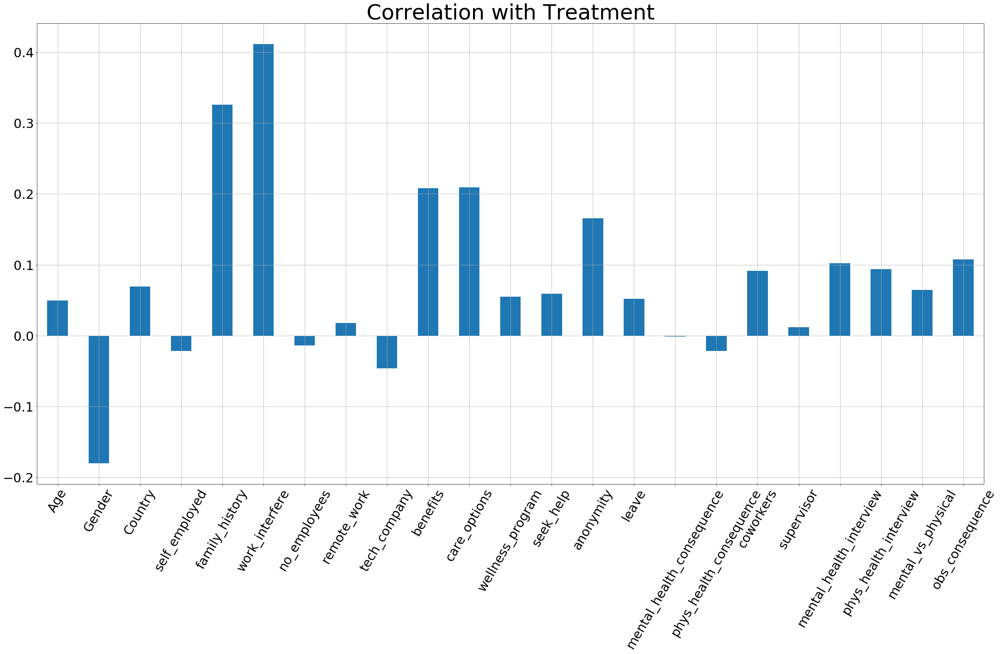

In [230]:
trtmnt = health.drop(['treatment'], axis='columns')
corr = trtmnt.corrwith(health['treatment'])
ax1 = corr.plot.bar(figsize=(40,20), fontsize = 30, rot = 60, grid = True)
ax1.set_title('Correlation with Treatment', fontsize=50)

Text(0.5, 1.0, 'Correlation with Anonymity')

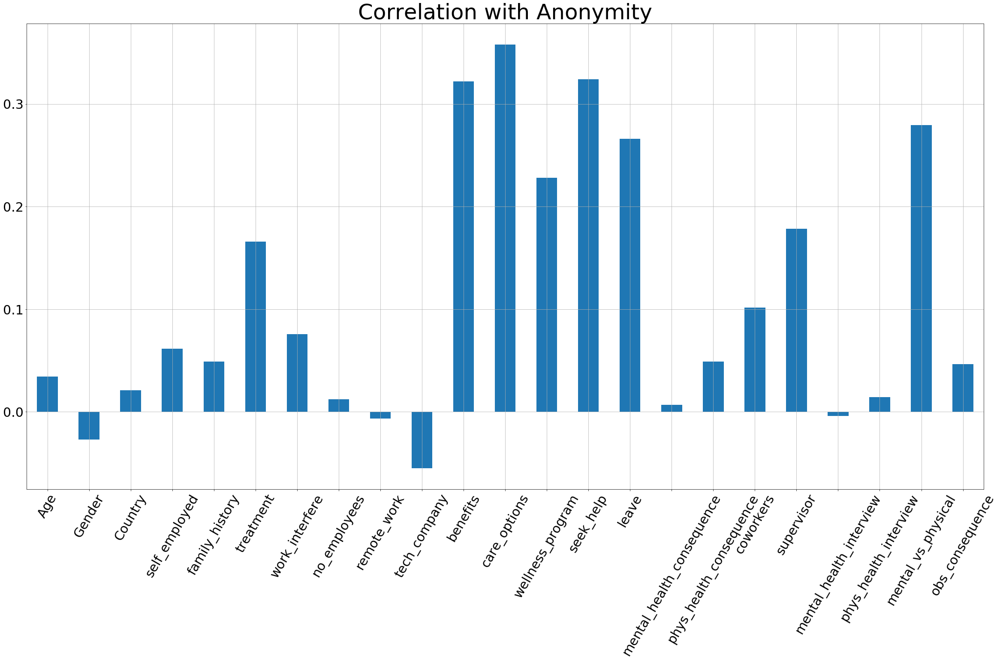

In [231]:
anon = health.drop(['anonymity'], axis='columns')
corr = anon.corrwith(health['anonymity'])
ax2 = corr.plot.bar(figsize=(40,20), fontsize = 30, rot = 60, grid = True)
ax2.set_title('Correlation with Anonymity', fontsize=50)

Text(0.5, 1.0, 'Correlation with Obs_consequence')

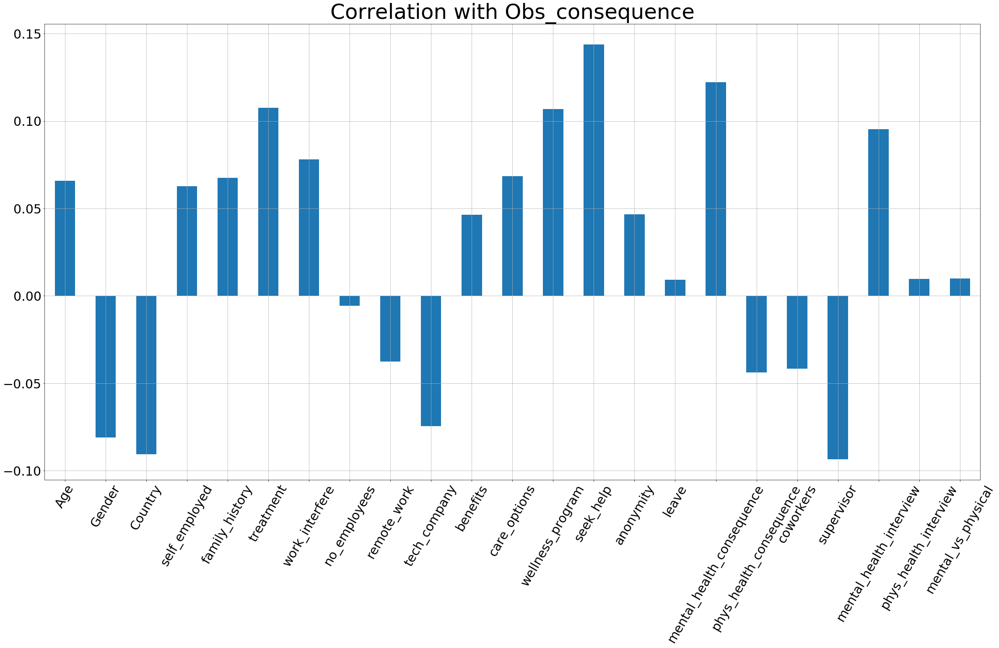

In [232]:
obs_con = health.drop(['obs_consequence'], axis='columns')
corr = obs_con.corrwith(health['obs_consequence'])
ax3 = corr.plot.bar(figsize=(40,20), fontsize = 30, rot = 60, grid = True)
ax3.set_title('Correlation with Obs_consequence', fontsize=50)

In [33]:
#Creating new datasets with the selected features above
classes = health[['treatment', 'anonymity', 'obs_consequence']]
health_fs1 = health[['work_interfere','family_history','care_options', 'seek_help', 'mental_health_consequence']]
health_fs1 = pd.concat([classes,health_fs1], axis=1)

health_fs2 = health[['benefits', 'mental_vs_physical', 'wellness_program']]
health_fs2 = pd.concat([health_fs1,health_fs2], axis=1)

health_fs3 = health[['mental_health_interview', 'leave', 'self_employed']]
health_fs3 = pd.concat([health_fs2,health_fs3], axis=1)

In [34]:
#Feature scaling so all the categories will be in the same range
cols = health.columns
scale = RobustScaler()

health_scaled = scale.fit_transform(health)

health_scaled = pd.DataFrame(health_scaled, columns=[cols])

health_scaled.head()

,Age,Gender,Country,self_employed,family_history,treatment,work_interfere,no_employees,remote_work,tech_company,...,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence
0,1.473684,0.0,0.466667,1.0,1.0,-1.0,0.5,-0.666667,1.0,0.0,...,1.0,1.2,0.0,0.0,1.0,0.5,0.0,1.0,0.5,1.0
1,-0.315789,0.0,0.833333,0.0,1.0,0.0,0.5,-0.333333,0.0,0.0,...,0.5,0.0,-0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.105263,0.0,0.666667,1.0,0.0,-1.0,-1.0,-0.666667,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.5,0.0
3,1.473684,0.0,0.433333,0.0,0.0,0.0,-0.5,0.000000,1.0,0.0,...,0.0,-0.4,-0.5,0.0,0.0,0.5,0.0,-1.0,0.0,0.0
4,0.947368,0.0,0.200000,0.0,0.0,0.0,-1.0,1.000000,0.0,-1.0,...,0.0,-0.4,-0.5,0.0,-1.0,-0.5,0.0,1.0,-0.5,0.0


In [35]:
#Now we can find a numerical analysis of the data
health.describe()

,Age,Gender,Country,self_employed,family_history,treatment,work_interfere,no_employees,remote_work,tech_company,...,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence
count,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,...,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000
mean,32.529843,1.765445,44.610471,0.126702,0.456545,0.638743,1.902618,2.750785,0.303665,0.816754,...,0.671204,1.451309,0.871204,0.826178,0.970681,1.068063,0.883770,0.713089,0.833508,0.169634
std,7.252550,0.447986,22.018695,0.332813,0.498369,0.480616,1.206179,1.766414,0.460081,0.387071,...,0.915026,1.493692,0.796453,0.500676,0.618698,0.838397,0.404506,0.719150,0.827038,0.375507
min,21.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,2.000000,36.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,32.000000,2.000000,40.000000,0.000000,0.000000,1.000000,2.000000,2.000000,0.000000,1.000000,...,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
75%,36.500000,2.000000,66.000000,0.000000,1.000000,1.000000,3.000000,4.000000,1.000000,1.000000,...,2.000000,2.500000,2.000000,1.000000,1.000000,2.000000,1.000000,1.000000,2.000000,0.000000
max,72.000000,2.000000,80.000000,1.000000,1.000000,1.000000,3.000000,5.000000,1.000000,1.000000,...,2.000000,4.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000


In [36]:
health_scaled.describe()

,Age,Gender,Country,self_employed,family_history,treatment,work_interfere,no_employees,remote_work,tech_company,...,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence
count,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,...,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000,955.000000
mean,0.055773,-0.234555,0.153682,0.126702,0.456545,-0.361257,-0.048691,0.250262,0.303665,-0.183246,...,0.335602,0.180524,-0.064398,-0.173822,-0.029319,0.034031,-0.116230,-0.286911,-0.083246,0.169634
std,0.763426,0.447986,0.733957,0.332813,0.498369,0.480616,0.603089,0.588805,0.460081,0.387071,...,0.457513,0.597477,0.398227,0.500676,0.618698,0.419199,0.404506,0.719150,0.413519,0.375507
min,-1.157895,-2.000000,-1.333333,0.000000,0.000000,-1.000000,-1.000000,-0.666667,0.000000,-1.000000,...,0.000000,-0.400000,-0.500000,-1.000000,-1.000000,-0.500000,-1.000000,-1.000000,-0.500000,0.000000
25%,-0.526316,0.000000,-0.133333,0.000000,0.000000,-1.000000,-0.500000,-0.333333,0.000000,0.000000,...,0.000000,-0.400000,-0.500000,0.000000,0.000000,-0.500000,0.000000,-1.000000,-0.500000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.473684,0.000000,0.866667,0.000000,1.000000,0.000000,0.500000,0.666667,1.000000,0.000000,...,1.000000,0.600000,0.500000,0.000000,0.000000,0.500000,0.000000,0.000000,0.500000,0.000000
max,4.210526,0.000000,1.333333,1.000000,1.000000,0.000000,0.500000,1.000000,1.000000,0.000000,...,1.000000,1.200000,0.500000,1.000000,1.000000,0.500000,1.000000,1.000000,0.500000,1.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001DDB9920358>,
      dtype=object)

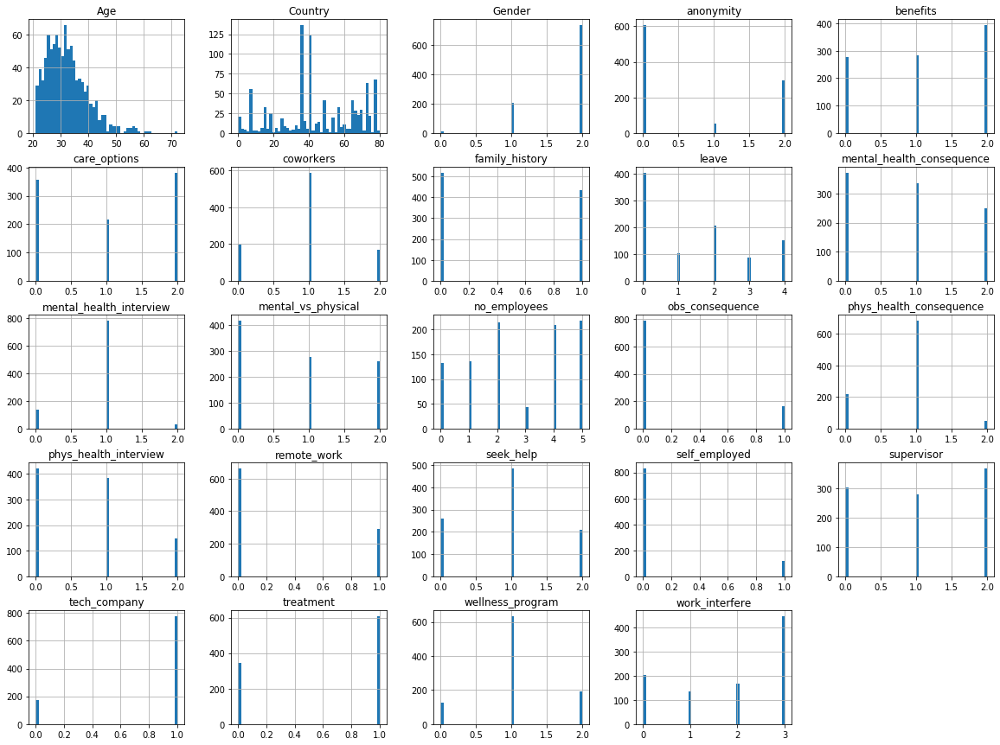

In [37]:
#Plotting a histogram plot of all the values in health against 
#the number of occurences
health.hist(bins=50, figsize=(20,15))
#health.plot(kind="scatter", x="Age", y="treatment")

In [38]:
#Finding correlation of features with respect to 'treatment'
corr_matrix = health.corr()
corr_matrix['treatment'].sort_values(ascending=False)

treatment                    1.000000
work_interfere               0.411186
family_history               0.326065
care_options                 0.209369
benefits                     0.207725
anonymity                    0.165811
obs_consequence              0.107587
mental_health_interview      0.101906
phys_health_interview        0.094062
coworkers                    0.091247
Country                      0.069496
mental_vs_physical           0.064768
seek_help                    0.058830
wellness_program             0.055003
leave                        0.052129
Age                          0.049557
remote_work                  0.017845
supervisor                   0.011659
mental_health_consequence   -0.001190
no_employees                -0.013556
self_employed               -0.021547
phys_health_consequence     -0.021644
tech_company                -0.046316
Gender                      -0.179749
Name: treatment, dtype: float64

#Finding correlation of features with respect to 'wellness_program'
corr_matrix['wellness_program'].sort_values(ascending=False)

#Finding correlation of features with respect to 'supervisor'
corr_matrix['supervisor'].sort_values(ascending=False)

#Creating new datasets using the top 2/4/7 features found in the correlation data above
health_2 = [health['seek_help'], health['benefits'], health['coworkers'], health['mental_vs_physical'], health['family_history'], health['work_interfere']]
health_3 = [[health_2], health['care_options'], health['anonymity'], health['leave']]
health_4 = [[health_3], health['phys_health_interview'], health['mental_health_interview'], health['obs_consequence'], health['no_employees'], health['phys_health_consequence']]

#Checking to see if the dataset has been created successfully
health_2

attributes = ['treatment', 'family_history', 'obs_consequence', 'leave']
scatter_matrix(health[attributes], figsize=(12,8))

In [39]:
export_data('Health Survey Encoded.xlsx', health, 'Original', style='new')
export_data('Health Survey Encoded.xlsx', health_fs1, 'Feature Selection 1', style='append')
export_data('Health Survey Encoded.xlsx', health_fs2, 'Feature Selection 2', style='append')
export_data('Health Survey Encoded.xlsx', health_fs3, 'Feature Selection 3', style='append')

In [40]:
health_fs1

,treatment,anonymity,obs_consequence,work_interfere,family_history,care_options,seek_help,mental_health_consequence
18,0.0,2.0,1.0,3.0,1.0,1.0,0.0,1.0
20,1.0,1.0,0.0,3.0,1.0,2.0,1.0,0.0
21,0.0,2.0,0.0,0.0,0.0,0.0,1.0,1.0
22,1.0,0.0,0.0,1.0,0.0,2.0,1.0,0.0
23,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
24,1.0,2.0,0.0,2.0,1.0,1.0,2.0,1.0
25,1.0,1.0,0.0,3.0,1.0,2.0,0.0,2.0
27,1.0,0.0,0.0,2.0,1.0,2.0,0.0,1.0
28,1.0,0.0,0.0,3.0,0.0,1.0,0.0,1.0
29,0.0,0.0,0.0,3.0,0.0,0.0,1.0,2.0


--------------------------------------------------------------------------------------------

# Applying Bayes Classifier to the Data

## Original dataset: treatment

### Code has been adapted from https://github.com/ageron/handson-ml2
### and https://www.kaggle.com/prashant111/naive-bayes-classifier-in-python

In [41]:
#Importing required packages
from sklearn.naive_bayes import GaussianNB

In [242]:
#Reading encoded dataset in excel
NB_health = read_data('Health Survey Encoded.xlsx', sheetname='Original')

In [243]:
#Creating class label and testing it against the rest of the features
health_features = NB_health.drop(['treatment'], axis=1)
label = np.array(NB_health[['treatment']]).flatten()

In [209]:
#Splitting the data set into training and testing subsets
x_train, x_test, y_train, y_test = train_test_split(health_features, label,
                                                    test_size=0.3, random_state=109)

print(f'The shape of the data sets are x_train:{x_train.shape}, x_test:{x_test.shape}')
print(f'Unique values in y_test: {np.unique(y_test, return_counts=True)}')

The shape of the data sets are x_train:(668, 23), x_test:(287, 23)
Unique values in y_test: (array([0., 1.]), array([109, 178], dtype=int64))


In [210]:
y_unique = np.unique(y_test, return_counts=True)

In [211]:
#Creating a Guassian Naive Bayes model
NB_model = GaussianNB()
NB_model.fit(x_train, y_train)

#Using the classifier on our test subset
y_pred = NB_model.predict(x_test)

#Using NB classifier on our training subset
y_pred_train = NB_model.predict(x_train)

In [212]:
#Calculating the accuracy of the model
print(f'Model accuracy score: {accuracy_score(y_test, y_pred):.4f}')

#Calculating the accuracy of our model on the training dataset
print(f'Training-set accuracy score: {accuracy_score(y_train, y_pred_train):.4f}')

Model accuracy score: 0.7422
Training-set accuracy score: 0.7455


In [213]:
#Calculating the null accuracy score of our data set
null_accuracy = (y_unique[1][1]/(y_unique[1][1]+y_unique[1][0]))
print('Null accuracy score: {0:0.4f}'.format(null_accuracy))

Null accuracy score: 0.6202


In [214]:
#Calculating the confusion matrix of our classification model
NB_confusion_matrix = confusion_matrix(y_test, y_pred)

#Setting the different model performance metrics
TP = NB_confusion_matrix[0,0]
TN = NB_confusion_matrix[1,1]
FP = NB_confusion_matrix[0,1]
FN = NB_confusion_matrix[1,0]

print('Confusion matrix\n', NB_confusion_matrix)
print(f'\nTrue Positives(TP) = {TP}')
print(f'\nTrue Negatives(TN) = {TN}')
print(f'\nFalse Positives(FP) = {FP}')
print(f'\nFalse Negatives(FN) = {FN}')

Confusion matrix
 [[ 71  38]
 [ 36 142]]

True Positives(TP) = 71

True Negatives(TN) = 142

False Positives(FP) = 38

False Negatives(FN) = 36


In [215]:
print(np.unique(y_test, return_counts=True))
np.unique(y_pred, return_counts=True)

(array([0., 1.]), array([109, 178], dtype=int64))


(array([0., 1.]), array([107, 180], dtype=int64))

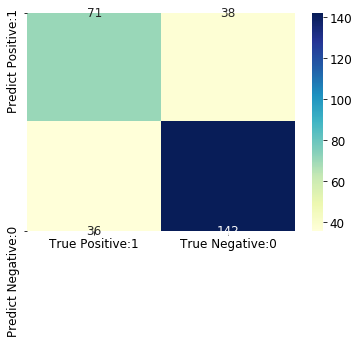

In [216]:
cm_matrix = pd.DataFrame(data=NB_confusion_matrix, columns=['True Positive:1', 'True Negative:0'], index=['Predict Positive:1', 'Predict Negative:0'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [217]:
#Calculating the precision, TP_rate, f-score and support of the model

#The accuracy of the classification
classification_accuracy = (TP + TN) / float(TP + TN + FP + FN)

#The error of the classification
classification_error = (FP + FN) / float(TP + TN + FP + FN)

#The precision of the classification
precision = TP / float(TP + FP)

#The True Postivie Rate (Recall)
TP_rate = TP / float(TP + FN)

#The False Positive Rate
FP_rate = FP / float(FP+TN)

print(classification_report(y_test, y_pred))
print(f'Classification accuracy : {classification_accuracy:.4f}')
print(f'Classification error : {classification_error:.4f}')
print(f'Precision : {precision:.4f}')
print(f'TP_Rate : {TP_rate:.4f}')
print(f'FP_Rate : {FP_rate:.4f}')

              precision    recall  f1-score   support

         0.0       0.66      0.65      0.66       109
         1.0       0.79      0.80      0.79       178

    accuracy                           0.74       287
   macro avg       0.73      0.72      0.73       287
weighted avg       0.74      0.74      0.74       287

Classification accuracy : 0.7422
Classification error : 0.2578
Precision : 0.6514
TP_Rate : 0.6636
FP_Rate : 0.2111


In [218]:
#Checking probability of getting 1 or 0 for treatment for each feature
y_pred_prob = NB_model.predict_proba(x_test)[0:10]
y_pred_prob_df = pd.DataFrame(y_pred_prob, columns=['Prob of no treatment', 'Prob of treatment'])
y_pred_prob_df

,Prob of no treatment,Prob of treatment
0,0.132015,0.867985
1,0.974687,0.025313
2,0.086000,0.914000
3,0.080152,0.919848
4,0.744977,0.255023
5,0.082981,0.917019
6,0.007835,0.992165
7,0.457397,0.542603
8,0.156660,0.843340
9,0.743751,0.256249


In [53]:
NB_model.predict_proba(x_test)[0:10, 1]
y_pred1 = NB_model.predict_proba(x_test)[:,1]

Text(0, 0.5, 'Frequency')

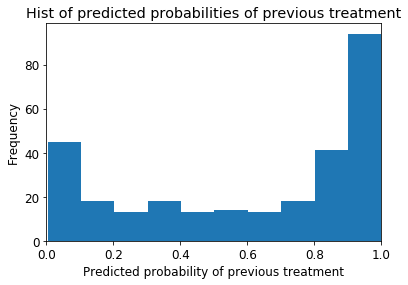

In [54]:
plt.rcParams['font.size'] = 12
plt.hist(y_pred1, bins=10)
plt.title('Hist of predicted probabilities of previous treatment')
plt.xlim(0,1)
plt.xlabel('Predicted probability of previous treatment')
plt.ylabel('Frequency')

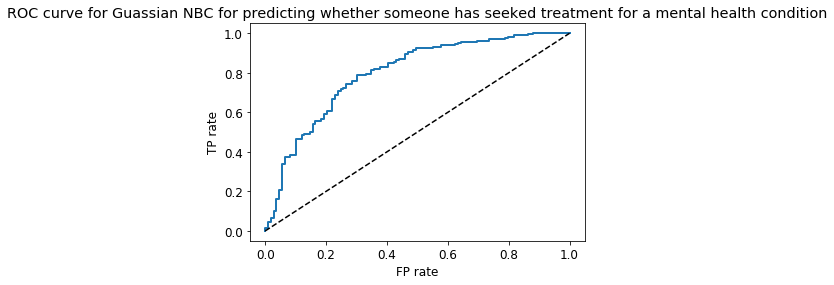

In [55]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred1, pos_label = 1)

plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--')
plt.rcParams['font.size'] = 12
plt.title('ROC curve for Guassian NBC for predicting whether someone has seeked treatment for a mental health condition')
plt.xlabel('FP rate')
plt.ylabel('TP rate')
plt.show()

In [56]:
score = cross_val_score(NB_model, x_train, y_train, cv=10, scoring="accuracy")
score

array([0.74626866, 0.70149254, 0.65671642, 0.80597015, 0.65671642,
       0.7761194 , 0.73134328, 0.79104478, 0.71212121, 0.71212121])

In [57]:
health.shape

(955, 24)

# Applying K-Means to the Data

### Code has been adapted from https://github.com/ageron/handson-ml2

In [58]:
#Importing required packages
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture as GMM
from sklearn.metrics import homogeneity_completeness_v_measure, silhouette_samples, silhouette_score

In [244]:
#Loading encoded data to new variable
KMeans_health = read_data('Health Survey Encoded.xlsx', sheetname='Original')

#Different Datasets made from correlation with classes: 
#'treatment', 'anonymity', 'obs_consequence'
kmeans_fs1 = read_data('Health Survey Encoded.xlsx', sheetname='Feature Selection 1')
kmeans_fs2 = read_data('Health Survey Encoded.xlsx', sheetname='Feature Selection 2')
kmeans_fs3 = read_data('Health Survey Encoded.xlsx', sheetname='Feature Selection 3')

In [59]:
#The following code has been taken from the python tutorial 4 from canvas and adapted to fit my data
def plot_data(X):
    plt.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=30, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=50, linewidths=50,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, xlabel='x', ylabel='y', resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel(xlabel, fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel(ylabel, fontsize=14, rotation=90)
    else:
        plt.tick_params(labelleft=False)

In [61]:
#Clustering 'treatment' and 'work_interfere' data
trtmnt_wrk_int = KMeans_health[['treatment', 'work_interfere']].to_numpy()

k = 5
kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(trtmnt_wrk_int)

In [62]:
kmeans.labels_

array([0, 3, 2, 1, 1, 4, 3, 4, 3, 0, 2, 0, 3, 3, 3, 4, 0, 4, 3, 3, 3, 3,
       0, 4, 1, 2, 4, 3, 1, 3, 3, 2, 0, 0, 1, 0, 0, 2, 2, 0, 2, 0, 3, 2,
       0, 2, 2, 1, 2, 1, 4, 3, 2, 3, 3, 2, 0, 3, 3, 1, 3, 2, 3, 2, 0, 3,
       4, 2, 3, 3, 3, 4, 2, 2, 1, 0, 2, 3, 1, 1, 2, 4, 0, 3, 0, 2, 1, 2,
       2, 1, 3, 3, 2, 4, 2, 0, 4, 2, 0, 2, 4, 3, 3, 1, 4, 3, 3, 3, 2, 0,
       3, 2, 0, 0, 3, 1, 1, 3, 2, 1, 3, 2, 0, 2, 3, 1, 0, 1, 1, 3, 0, 4,
       0, 2, 2, 0, 3, 3, 3, 1, 0, 3, 3, 1, 2, 0, 1, 3, 3, 3, 1, 1, 0, 3,
       2, 0, 0, 2, 3, 3, 4, 3, 0, 2, 1, 3, 3, 3, 3, 2, 3, 1, 3, 4, 3, 4,
       0, 1, 3, 2, 1, 4, 0, 3, 4, 3, 3, 1, 2, 0, 1, 0, 4, 0, 4, 0, 3, 2,
       3, 3, 4, 3, 4, 2, 2, 3, 2, 1, 3, 3, 2, 3, 3, 0, 1, 4, 1, 4, 0, 1,
       4, 1, 3, 2, 1, 4, 3, 2, 3, 4, 2, 3, 2, 4, 3, 1, 2, 3, 0, 0, 0, 0,
       3, 3, 1, 0, 3, 1, 3, 2, 1, 0, 3, 3, 3, 3, 4, 4, 4, 3, 1, 4, 3, 1,
       4, 3, 4, 1, 4, 3, 4, 1, 1, 4, 3, 1, 3, 4, 2, 3, 3, 4, 4, 2, 1, 2,
       0, 2, 3, 1, 3, 3, 3, 1, 2, 1, 4, 2, 3, 3, 1,

In [63]:
kmeans.cluster_centers_

array([[-3.33066907e-16,  2.69078947e+00],
       [ 8.79518072e-01,  8.19277108e-01],
       [-3.33066907e-16,  1.11022302e-15],
       [ 1.00000000e+00,  3.00000000e+00],
       [ 1.00000000e+00,  2.00000000e+00]])

In [64]:
ta = pd.DataFrame(trtmnt_wrk_int, columns=('treatment', 'work_interfere'))
ta['Clusters'] = kmeans.labels_

In [65]:
ta.columns

Index(['treatment', 'work_interfere', 'Clusters'], dtype='object')

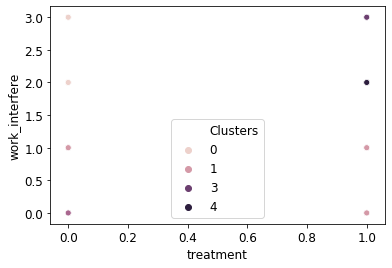

In [66]:
sns.scatterplot(x='treatment', y='work_interfere', hue='Clusters', data=ta)

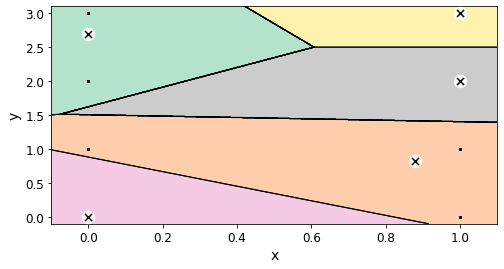

In [67]:
#A plot of the optimal clusters found for the data set as the default values are high for kmeans class
plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans, trtmnt_wrk_int)
plt.show()

In [68]:
#Converting the tretmnt_wrk_int array into a cluster-distance space
kmeans.transform(trtmnt_wrk_int)

array([[3.09210526e-01, 2.35140477e+00, 3.00000000e+00, 1.00000000e+00,
        1.41421356e+00],
       [1.04671445e+00, 2.18404859e+00, 3.16227766e+00, 0.00000000e+00,
        1.00000000e+00],
       [2.69078947e+00, 1.20198462e+00, 1.15910687e-15, 3.16227766e+00,
        2.23606798e+00],
       ...,
       [1.96437498e+00, 2.17201884e-01, 1.41421356e+00, 2.00000000e+00,
        1.00000000e+00],
       [1.04671445e+00, 2.18404859e+00, 3.16227766e+00, 0.00000000e+00,
        1.00000000e+00],
       [1.04671445e+00, 2.18404859e+00, 3.16227766e+00, 0.00000000e+00,
        1.00000000e+00]])

In [69]:
#Trying out different iteration values
kmeans_iter1 = KMeans(n_clusters=5, init="random", n_init=3,
                     algorithm="full", max_iter=1, random_state=1)
kmeans_iter2 = KMeans(n_clusters=5, init="random", n_init=3,
                     algorithm="full", max_iter=2, random_state=1)
kmeans_iter3 = KMeans(n_clusters=5, init="random", n_init=3,
                     algorithm="full", max_iter=3, random_state=1)
kmeans_iter1.fit(trtmnt_wrk_int)
kmeans_iter2.fit(trtmnt_wrk_int)
kmeans_iter3.fit(trtmnt_wrk_int)

C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "
C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "
C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "


KMeans(algorithm='full', init='random', max_iter=3, n_clusters=5, n_init=3,
       random_state=1)

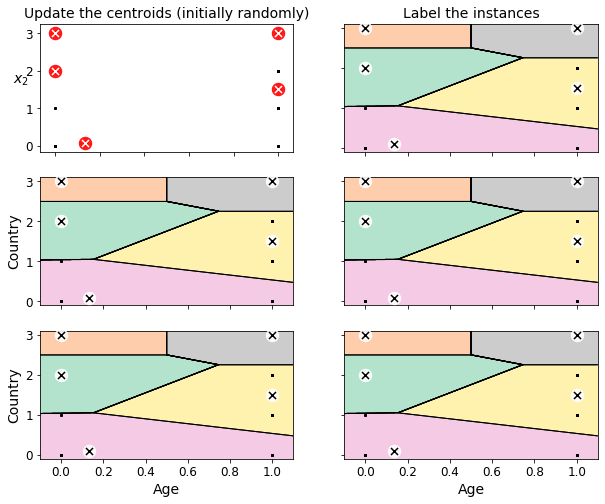

In [70]:
#Plotting how the iteration values change the outcome of the clusters
plt.figure(figsize=(10, 8))

plt.subplot(321)
plot_data(trtmnt_wrk_int)
plot_centroids(kmeans_iter1.cluster_centers_, circle_color='r', cross_color='w')
plt.ylabel("$x_2$", fontsize=14, rotation=0)
plt.tick_params(labelbottom=False)
plt.title("Update the centroids (initially randomly)", fontsize=14)

plt.subplot(322)
plot_decision_boundaries(kmeans_iter1, trtmnt_wrk_int, xlabel='Age', ylabel='Country', show_xlabels=False, show_ylabels=False)
plt.title("Label the instances", fontsize=14)

plt.subplot(323)
plot_decision_boundaries(kmeans_iter1, trtmnt_wrk_int, xlabel='Age', ylabel='Country', show_centroids=False, show_xlabels=False)
plot_centroids(kmeans_iter2.cluster_centers_)

plt.subplot(324)
plot_decision_boundaries(kmeans_iter2, trtmnt_wrk_int, xlabel='Age', ylabel='Country', show_xlabels=False, show_ylabels=False)

plt.subplot(325)
plot_decision_boundaries(kmeans_iter2, trtmnt_wrk_int, xlabel='Age', ylabel='Country', show_centroids=False)
plot_centroids(kmeans_iter3.cluster_centers_)

plt.subplot(326)
plot_decision_boundaries(kmeans_iter3, trtmnt_wrk_int, xlabel='Age', ylabel='Country', show_ylabels=False)

plt.show()

In [71]:
def plot_clusterer_comparison(clusterer1, clusterer2, X, title1=None, title2=None):
    clusterer1.fit(X)
    clusterer2.fit(X)

    plt.figure(figsize=(10, 3.2))

    plt.subplot(121)
    plot_decision_boundaries(clusterer1, X)
    if title1:
        plt.title(title1, fontsize=14)

    plt.subplot(122)
    plot_decision_boundaries(clusterer2, X, show_ylabels=False)
    if title2:
        plt.title(title2, fontsize=14)

C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "
C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "


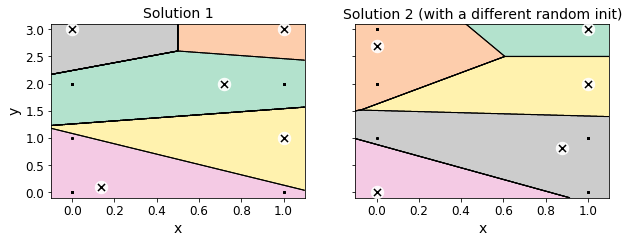

In [72]:
#Plot comparing two different random initial clusters
kmeans_rnd_init1 = KMeans(n_clusters=5, init="random", n_init=1,
                         algorithm="full", random_state=44)
kmeans_rnd_init2 = KMeans(n_clusters=5, init="random", n_init=1,
                         algorithm="full", random_state=64)

plot_clusterer_comparison(kmeans_rnd_init1, kmeans_rnd_init2, trtmnt_wrk_int,
                          "Solution 1", "Solution 2 (with a different random init)")
plt.show()

In [73]:
#Finding distance of the data points from a cluster and then finding
#the sum of squared distances of the data points to their closest cluster
X_dist = kmeans.transform(trtmnt_wrk_int)
np.sum(X_dist[np.arange(len(X_dist)), kmeans.labels_]**2)

74.63577996195282

In [74]:
#Negative value of the above as in the case of kmeans, we want bigger to be better.
kmeans.score(trtmnt_wrk_int)

-74.63577996195302

In [75]:
kmeans_rnd_init1.inertia_

77.94285867726394

In [76]:
kmeans_rnd_init2.inertia_

74.63577996195309

In [77]:
#Kmeans algorithm with 10 iterations of initial random cluster assignment
#and taking the lowest inertia one in the end with 10 iterations each
kmeans_rnd_10_inits = KMeans(n_clusters=5, init="random", n_init=10, max_iter=10,
                              algorithm="full", random_state=11)
kmeans_rnd_10_inits.fit(trtmnt_wrk_int)

C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "


KMeans(algorithm='full', init='random', max_iter=10, n_clusters=5,
       random_state=11)

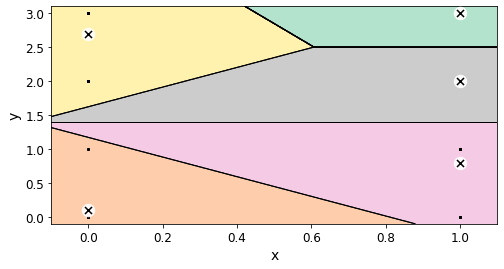

In [78]:
plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans_rnd_10_inits, trtmnt_wrk_int)
plt.show()

In [79]:
#Computing homogeneity and completeness of our kmeans model
homogeneity_completeness_v_measure(kmeans_rnd_10_inits.labels_, KMeans_health['treatment'])
homogeneity_completeness_v_measure(kmeans_rnd_10_inits.labels_, KMeans_health['work_interfere'])

(0.668149603227304, 0.8078285905200503, 0.7313798462852275)

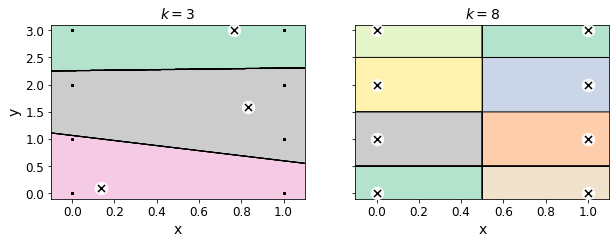

In [80]:
kmeans_k3 = KMeans(n_clusters=3, random_state=42)
kmeans_k8 = KMeans(n_clusters=8, random_state=42)

plot_clusterer_comparison(kmeans_k3, kmeans_k8, trtmnt_wrk_int, "$k=3$", "$k=8$")
plt.show()

In [81]:
kmeans_k3.inertia_

232.26248099542838

In [82]:
kmeans_k8.inertia_

1.0357743685551885e-27

### Finding optimal number for k

In [83]:
kmeans_per_k = [KMeans(n_clusters=k, random_state=42).fit(trtmnt_wrk_int)
                for k in range(1, 10)]
inertias = [model.inertia_ for model in kmeans_per_k]

C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "
C:\Users\kikan\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: ConvergenceWarning: Number of distinct clusters (8) found smaller than n_clusters (9). Possibly due to duplicate points in X.
  


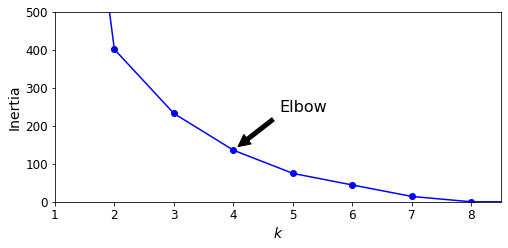

In [84]:
plt.figure(figsize=(8, 3.5))
plt.plot(range(1, 10), inertias, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
plt.annotate('Elbow',
             xy=(4, inertias[3]),
             xytext=(0.55, 0.55),
             textcoords='figure fraction',
             fontsize=16,
             arrowprops=dict(facecolor='black', shrink=0.1)
            )
plt.axis([1, 8.5, 0, 500])
plt.show()

In [85]:
kmeans_rnd_4_inits = KMeans(n_clusters=4, init="random", n_init=10,
                              algorithm="full", random_state=11)
kmeans_rnd_4_inits.fit(trtmnt_wrk_int)

C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "


KMeans(algorithm='full', init='random', n_clusters=4, random_state=11)

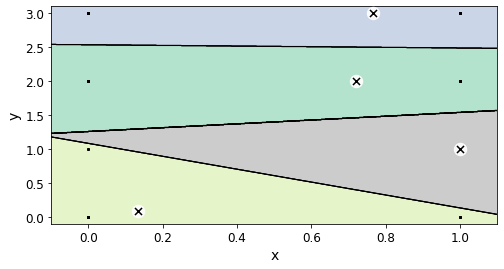

In [86]:
plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans_rnd_4_inits, trtmnt_wrk_int)
plt.show()

C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "


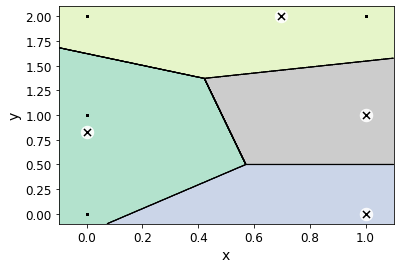

In [87]:
trtmnt_wp = KMeans_health[['treatment', 'wellness_program']].to_numpy()
kmeans_twp = KMeans(n_clusters=4, init='random', n_init=10, algorithm='full', random_state=8)
twp_pred = kmeans_twp.fit_predict(trtmnt_wp)

plt.figure()
plot_decision_boundaries(kmeans_twp, trtmnt_wp)

In [88]:
kmeans_twp.inertia_

81.11331300812995

C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "
C:\Users\kikan\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: ConvergenceWarning: Number of distinct clusters (8) found smaller than n_clusters (9). Possibly due to duplicate points in X.
  


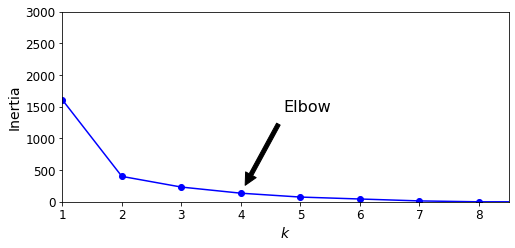

In [89]:
kmeans_per_k = [KMeans(n_clusters=k, random_state=42).fit(trtmnt_wrk_int)
                for k in range(1, 10)]
inertias = [model.inertia_ for model in kmeans_per_k]

plt.figure(figsize=(8, 3.5))
plt.plot(range(1, 10), inertias, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
plt.annotate('Elbow',
             xy=(4, inertias[3]),
             xytext=(0.55, 0.55),
             textcoords='figure fraction',
             fontsize=16,
             arrowprops=dict(facecolor='black', shrink=0.1)
            )
plt.axis([1, 8.5, 0, 3000])
plt.show()

C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "
C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "


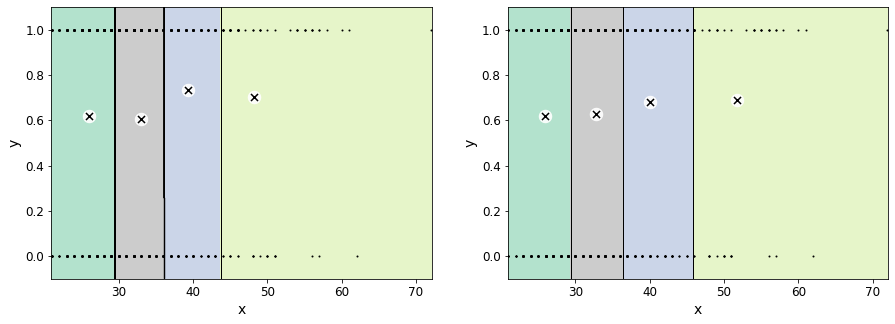

In [90]:
trtmnt_age = KMeans_health[['Age','treatment']].to_numpy()
kmeans_ta = KMeans(n_clusters=4, init='random', n_init=10, max_iter=1, algorithm='full', random_state=8)
ta_pred = kmeans_ta.fit_predict(trtmnt_age)
kmeans_ta2 = KMeans(n_clusters=4, init='random', n_init=10, max_iter=300, algorithm='full', random_state=8)
ta_pred = kmeans_ta2.fit_predict(trtmnt_age)

plt.figure(figsize=(15, 5))
plt.subplot(121)
plot_decision_boundaries(kmeans_ta, trtmnt_age)
plt.subplot(122)
plot_decision_boundaries(kmeans_ta2, trtmnt_age)

In [91]:
kmeans_ta

KMeans(algorithm='full', init='random', max_iter=1, n_clusters=4,
       random_state=8)

In [92]:
kmeans_ta.inertia_

6318.7467052364345

C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "


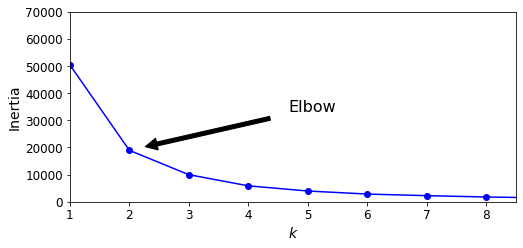

In [248]:
kmeans_per_k = [KMeans(n_clusters=k, random_state=42).fit(trtmnt_age)
                for k in range(1, 10)]
inertias = [model.inertia_ for model in kmeans_per_k]

plt.figure(figsize=(8, 3.5))
plt.plot(range(1, 10), inertias, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
plt.annotate('Elbow',
             xy=(2, inertias[1]),
             xytext=(0.55, 0.55),
             textcoords='figure fraction',
             fontsize=16,
             arrowprops=dict(facecolor='black', shrink=0.1)
            )
plt.axis([1, 8.5, 0, 70000])
plt.show()

In [94]:
#Creating class label and testing it against the rest of the features
health_features2 = KMeans_health.drop(['treatment'], axis=1)
label2 = KMeans_health[['treatment']].copy()

In [250]:
trtmnt_labels = []
for feature in health_features2.columns:
    trtmnt_label = pd.concat([health_features2[[feature]], label2], join = 'outer', axis = 1)
    trtmnt_labels.append(trtmnt_label)

kmeans_predict = []
kmeans_inertias = []
#kmeans_array = []
kmeans = KMeans(n_clusters=6, init='random', n_init=10, algorithm='full', random_state=8)
for idx, feature in enumerate(trtmnt_labels):
    #kmeans_array.append(kmeans)
    pred = kmeans.fit_predict(feature.to_numpy())
    kmeans_predict.append(pred)
    kmeans_inertias.append(kmeans.inertia_)

trtmnt_labels_array = np.asarray(trtmnt_labels)
kmeans_predict_array = np.asarray(kmeans_predict)

C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "
C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "
C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "
C:\Users\kikan\Anaconda3\

C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1077: ConvergenceWarning: Number of distinct clusters (4) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return self.fit(X, sample_weight=sample_weight).labels_


C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  f"KMeans is known to have a memory leak on Windows "


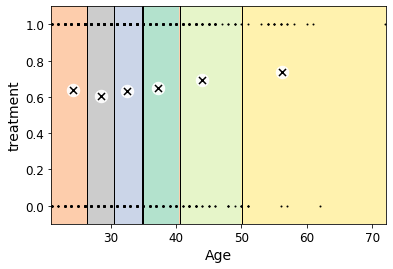

In [98]:
test = pd.concat([health_features2[['Age']], label2], join = 'outer', axis = 1)
kmeans = KMeans(n_clusters=6, init='random', n_init=10, algorithm='full', random_state=8)
tpred = kmeans.fit_predict(test.to_numpy())
plt.figure()
plot_decision_boundaries(kmeans, trtmnt_labels_array[0], 
                        xlabel=trtmnt_labels[0].columns[0],
                        ylabel=trtmnt_labels[0].columns[1])

In [99]:
plt.close('all')

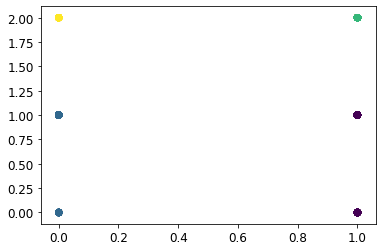

In [100]:
gmm_twp = GMM(n_components=4).fit(trtmnt_wp)
labels = gmm_twp.predict(trtmnt_wp)
plt.scatter(trtmnt_wp[:, 0], trtmnt_wp[:, 1], c=labels, s=40, cmap='viridis')

In [101]:
prob_twp = gmm_twp.predict_proba(trtmnt_wp)
print(prob_twp[:5].round(3))

[[0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]]


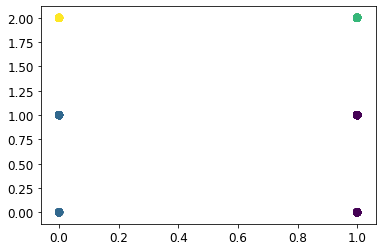

In [102]:
size = 50 * prob_twp.max(1) ** 2  # square emphasizes differences
plt.scatter(trtmnt_wp[:, 0], trtmnt_wp[:, 1], c=labels, cmap='viridis', s=size);

# Applying Decision Tree to the Data

### Code has been adapted from https://github.com/ageron/handson-ml2

In [103]:
#Importing required packages
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier

In [104]:
#Different Datasets made from correlation with classes: 
#'treatment', 'family_history', 'no_employees'
tree_fs1 = read_data('Health Survey Encoded.xlsx', sheetname='Feature Selection 1') 
tree_fs2 = read_data('Health Survey Encoded.xlsx', sheetname='Feature Selection 2')
tree_fs3 = read_data('Health Survey Encoded.xlsx', sheetname='Feature Selection 3')

In [105]:
classification_report_df = pd.DataFrame()

In [106]:
tree_fs1_inputs = tree_fs1.drop('treatment', axis='columns')
tree_fs1_target = tree_fs1[['treatment']]
feature_names=list(tree_fs1_inputs.columns)

## Testing decision tree algo on whole dataset

In [107]:
tree_clf_gen = DecisionTreeClassifier()
tree_clf_gen.fit(tree_fs1_inputs, tree_fs1_target)

DecisionTreeClassifier()

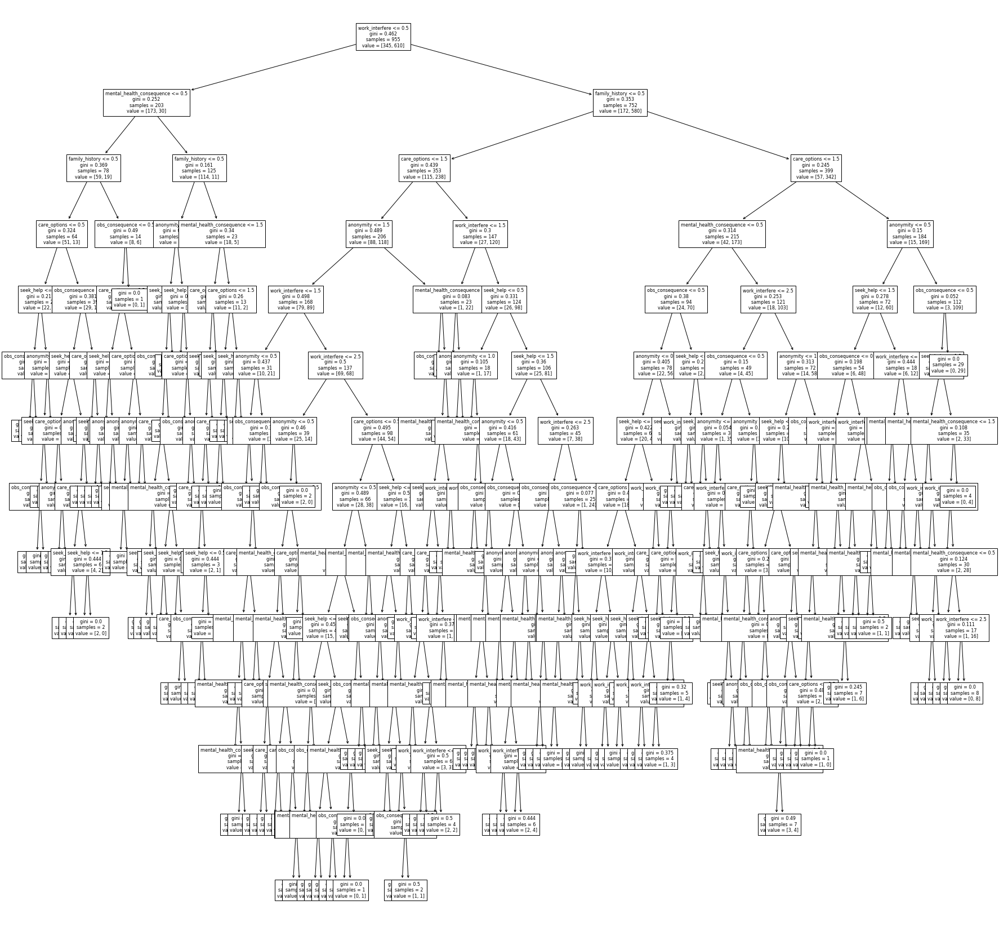

In [108]:
plt.figure(figsize=(30,30))
plot_tree(tree_clf_gen, feature_names=feature_names, fontsize=8)
plt.show()

In [109]:
tree_fs1_acc = tree_clf_gen.score(tree_fs1_inputs,tree_fs1_target)
tree_fs1_10cv = cross_val_score(tree_clf_gen, tree_fs1_inputs, tree_fs1_target, cv=10)
tree_fs1_predicted = tree_clf_gen.predict(tree_fs1_inputs).flatten()
tree_fs1_predicted_prob = list(tree_clf_gen.predict_proba(tree_fs1_inputs).flatten())

print(f'The mean accuracy for the model is:\n{tree_fs1_acc}')
print(f'\nThe 10-fold cross-validation accuracy is:\n{tree_fs1_10cv}')
# print(f'\nThe predicted values of treatment are:\n{tree_fs1_predicted}')
# print(f'\nThe probability of each value is:\n{tree_fs1_predicted_prob}')

The mean accuracy for the model is:
0.8586387434554974

The 10-fold cross-validation accuracy is:
[0.77083333 0.6875     0.6875     0.67708333 0.72916667 0.71578947
 0.68421053 0.71578947 0.70526316 0.68421053]


## Training set 80/20 split

### Training only

In [110]:
tree_x_train, tree_x_test, tree_y_train, tree_y_test = train_test_split(tree_fs1_inputs, tree_fs1_target, 
                                                    test_size=0.2, random_state=8)

tree_clf_train = DecisionTreeClassifier(criterion='entropy')
tree_clf_train.fit(tree_x_train, tree_y_train)

DecisionTreeClassifier(criterion='entropy')

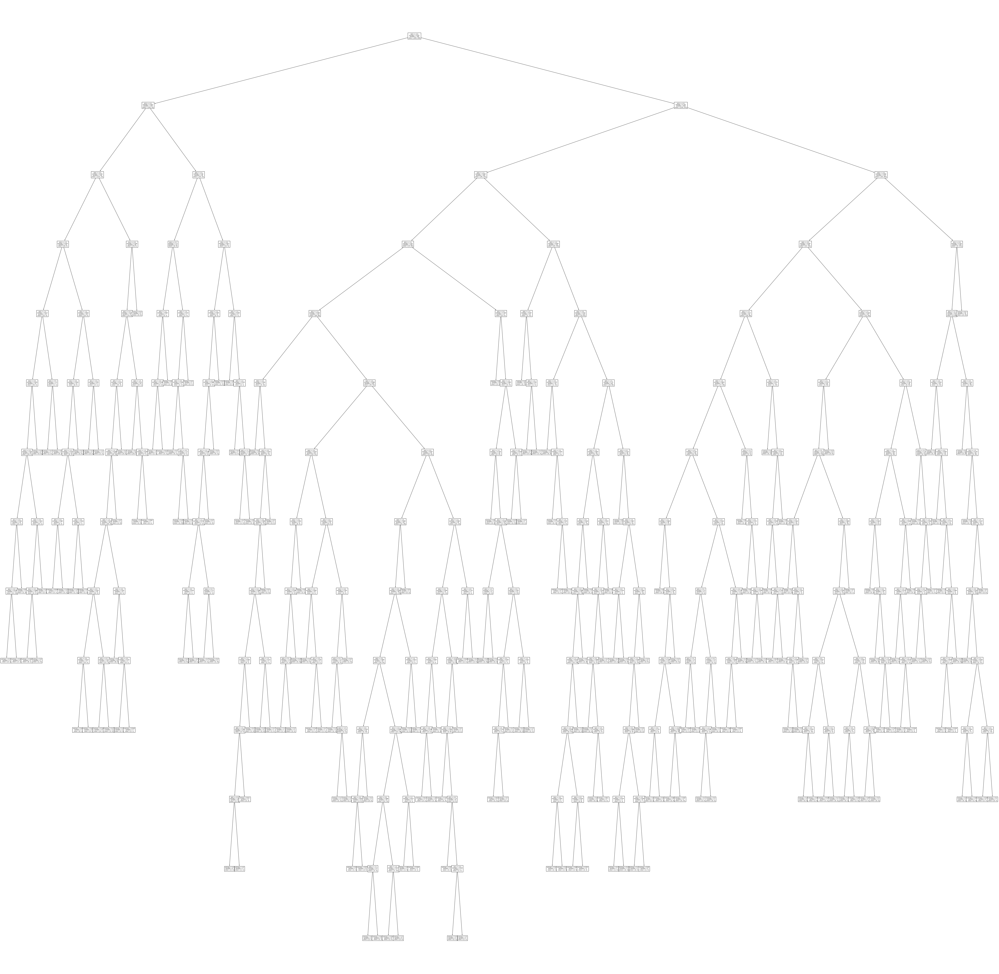

In [111]:
plt.figure(figsize=(100,100))
plot_tree(tree_clf_train, fontsize=7)
plt.show()

In [257]:
tree_y_train_unique = np.unique(tree_y_train, return_counts=True)
np.unique(tree_fs1_predicted, return_counts=True)

#Calculating metrics for the model
tree_train_acc = tree_clf_train.score(tree_x_train,tree_y_train)
tree_train_10cv = cross_val_score(tree_clf_train, tree_x_train, tree_y_train, cv=10)
tree_train_predicted = tree_clf_train.predict(tree_x_train).flatten()
tree_train_predicted_prob = list(tree_clf_train.predict_proba(tree_x_train).flatten())

#Calculating the confusion matrix of our classification model
tree_training_confusion_matrix = confusion_matrix(tree_y_train, tree_train_predicted)

#Calculating the null accuracy score of our data set
null_accuracy = (tree_y_train_unique[1][1]/(tree_y_train_unique[1][1]+tree_y_train_unique[1][0]))

empty_df = pd.DataFrame({'Train 80/20': []}).transpose()
cr = pd.DataFrame(classification_report(tree_y_train, tree_train_predicted, output_dict=True)).transpose()
classification_report_df = classification_report_df.append(cr)
classification_report_df = classification_report_df.append(empty_df)

print(classification_report(tree_y_train, tree_train_predicted))
print(f'Confusion matrix\n{tree_training_confusion_matrix}')
print(f'\nDefault training accuracy:\n{tree_train_acc}')
print(f'\nNull accuracy score:\n{null_accuracy:.4f}'.format(null_accuracy))
print(f'\nThe 10-fold cross-validation accuracy is:\n{tree_train_10cv}')

              precision    recall  f1-score   support

         0.0       0.83      0.83      0.83       266
         1.0       0.91      0.91      0.91       498

    accuracy                           0.88       764
   macro avg       0.87      0.87      0.87       764
weighted avg       0.88      0.88      0.88       764

Confusion matrix
[[222  44]
 [ 47 451]]

Default training accuracy:
0.8808900523560209

Null accuracy score:
0.6518

The 10-fold cross-validation accuracy is:
[0.84415584 0.80519481 0.81818182 0.64935065 0.73684211 0.75
 0.75       0.71052632 0.77631579 0.77631579]


### Applying to Test set

#### Deafult parameters for sklearn DecisionTreeClassifier

In [117]:
tree_clf_test = DecisionTreeClassifier(criterion='entropy')
tree_clf_test.fit(tree_x_train, tree_y_train)

DecisionTreeClassifier(criterion='entropy')

In [118]:
plt.figure(figsize=(140,140))
plot_tree(tree_clf_test, feature_names=feature_names, fontsize=8)
plt.show()

In [258]:
tree_y_test_unique = np.unique(tree_y_test, return_counts=True)

tree_test_acc = tree_clf_train.score(tree_x_test,tree_y_test)
tree_test_predicted = tree_clf_train.predict(tree_x_test).flatten()
tree_test_predicted_prob = list(tree_clf_train.predict_proba(tree_x_test).flatten())

#Calculating the confusion matrix of our classification model
tree_testing_confusion_matrix = confusion_matrix(tree_y_test, tree_test_predicted)

#Calculating the null accuracy score of our data set
null_accuracy = (tree_y_test_unique[1][1]/(tree_y_test_unique[1][1]+tree_y_test_unique[1][0]))

empty_df = pd.DataFrame({'Test 80/20': []}).transpose()
cr = pd.DataFrame(classification_report(tree_y_train, tree_train_predicted, output_dict=True)).transpose()
classification_report_df = classification_report_df.append(cr)
classification_report_df = classification_report_df.append(empty_df)

print(classification_report(tree_y_test, tree_test_predicted))
print(f'Confusion matrix\n{tree_testing_confusion_matrix}')
print(f'\nDefault testing accuracy:\n{tree_test_acc}')
print(f'\nNull accuracy score:\n{null_accuracy:.4f}')

              precision    recall  f1-score   support

         0.0       0.60      0.51      0.55        79
         1.0       0.69      0.76      0.72       112

    accuracy                           0.65       191
   macro avg       0.64      0.63      0.63       191
weighted avg       0.65      0.65      0.65       191

Confusion matrix
[[40 39]
 [27 85]]

Default testing accuracy:
0.6544502617801047

Null accuracy score:
0.5864


#### Changing splitting strategy

In [124]:
tree_clf_split = DecisionTreeClassifier(criterion='entropy', splitter='random', random_state=8)
tree_clf_split.fit(tree_x_train, tree_y_train)

plt.figure(figsize=(150,150))
plot_tree(tree_clf_split, feature_names=feature_names, fontsize=8)
plt.show()

In [263]:
tree_test_split_acc = tree_clf_split.score(tree_x_test,tree_y_test)
tree_test_split_predicted = tree_clf_split.predict(tree_x_test).flatten()
tree_test_split_predicted_prob = list(tree_clf_split.predict_proba(tree_x_test).flatten())



#Calculating the confusion matrix of our classification model
tree_test_split_confusion_matrix = confusion_matrix(tree_y_test, tree_test_split_predicted)

#Calculating the null accuracy score of our data set
null_accuracy = (tree_y_test_unique[1][1]/(tree_y_test_unique[1][1]+tree_y_test_unique[1][0]))

empty_df = pd.DataFrame({'Split 80/20': []}).transpose()
cr = pd.DataFrame(classification_report(tree_y_test, tree_test_split_predicted, output_dict=True)).transpose()
classification_report_df = classification_report_df.append(cr)
classification_report_df = classification_report_df.append(empty_df)

print(classification_report(tree_y_test, tree_test_split_predicted))
print(f'Confusion matrix\n{tree_testing_confusion_matrix}')
print(f'\nRandom split accuracy:\n{tree_test_split_acc}')
print(f'\nNull accuracy score:\n{null_accuracy:.4f}')

              precision    recall  f1-score   support

         0.0       0.58      0.48      0.53        79
         1.0       0.67      0.76      0.71       112

    accuracy                           0.64       191
   macro avg       0.63      0.62      0.62       191
weighted avg       0.64      0.64      0.64       191

Confusion matrix
[[40 39]
 [27 85]]

Random split accuracy:
0.643979057591623

Null accuracy score:
0.5864


#### Changing max depth

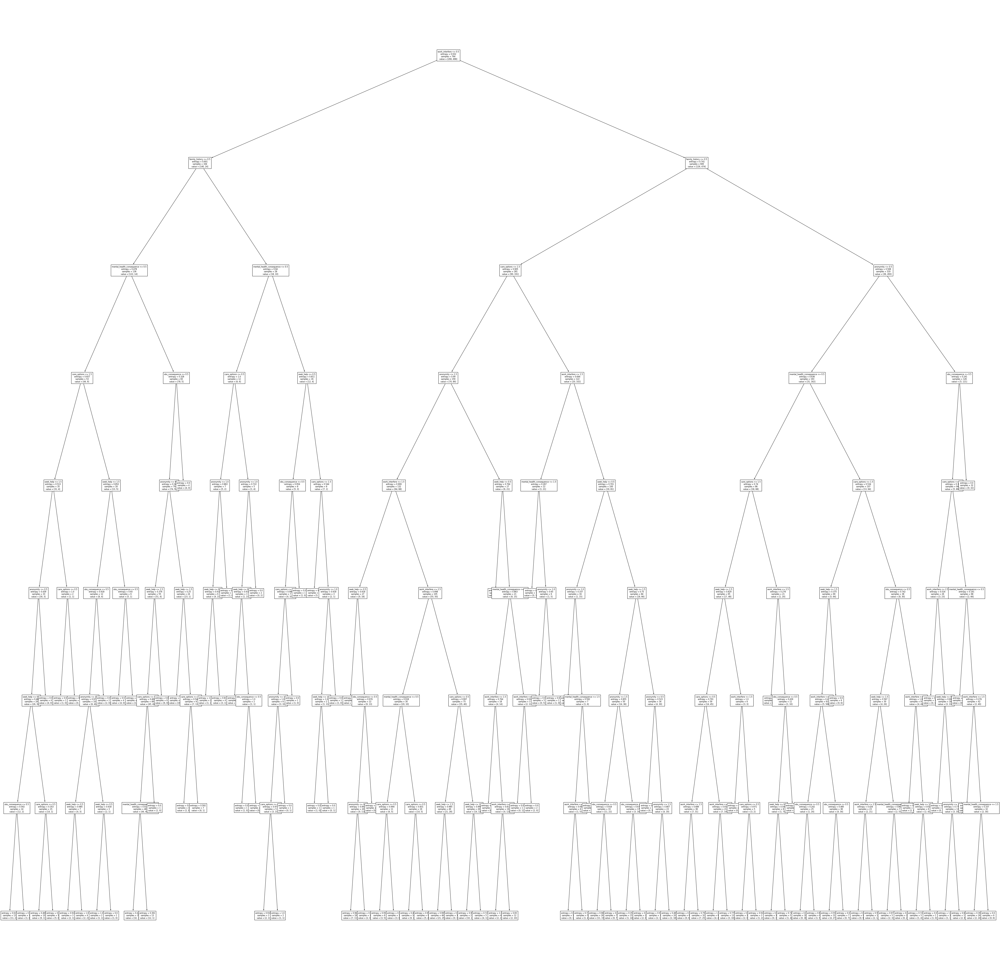

In [128]:
tree_clf_depth = DecisionTreeClassifier(criterion='entropy', max_depth=8, random_state=8)
tree_clf_depth.fit(tree_x_train, tree_y_train)

plt.figure(figsize=(75,75))
plot_tree(tree_clf_depth, feature_names=feature_names, fontsize=8)
plt.show()

In [266]:
tree_test_depth_acc = tree_clf_depth.score(tree_x_test,tree_y_test)
tree_test_depth_predicted = tree_clf_depth.predict(tree_x_test).flatten()
tree_test_depth_predicted_prob = list(tree_clf_depth.predict_proba(tree_x_test).flatten())

#Calculating the confusion matrix of our classification model
tree_test_depth_confusion_matrix = confusion_matrix(tree_y_test, tree_test_depth_predicted)

#Calculating the null accuracy score of our data set
null_accuracy = (tree_y_test_unique[1][1]/(tree_y_test_unique[1][1]+tree_y_test_unique[1][0]))

empty_df = pd.DataFrame({'Depth 80/20': []}).transpose()
cr = pd.DataFrame(classification_report(tree_y_test, tree_test_depth_predicted, output_dict=True)).transpose()
classification_report_df = classification_report_df.append(cr)
classification_report_df = classification_report_df.append(empty_df)

print(classification_report(tree_y_test, tree_test_depth_predicted))
print(f'Confusion matrix\n{tree_test_depth_confusion_matrix}')
print(f'\nMax depth accuracy:\n{tree_test_depth_acc}')
print(f'\nNull accuracy score:\n{null_accuracy:.4f}')

              precision    recall  f1-score   support

         0.0       0.65      0.44      0.53        79
         1.0       0.68      0.83      0.75       112

    accuracy                           0.67       191
   macro avg       0.66      0.64      0.64       191
weighted avg       0.67      0.67      0.66       191

Confusion matrix
[[35 44]
 [19 93]]

Max depth accuracy:
0.6701570680628273

Null accuracy score:
0.5864


#### Changing min sample per leaf

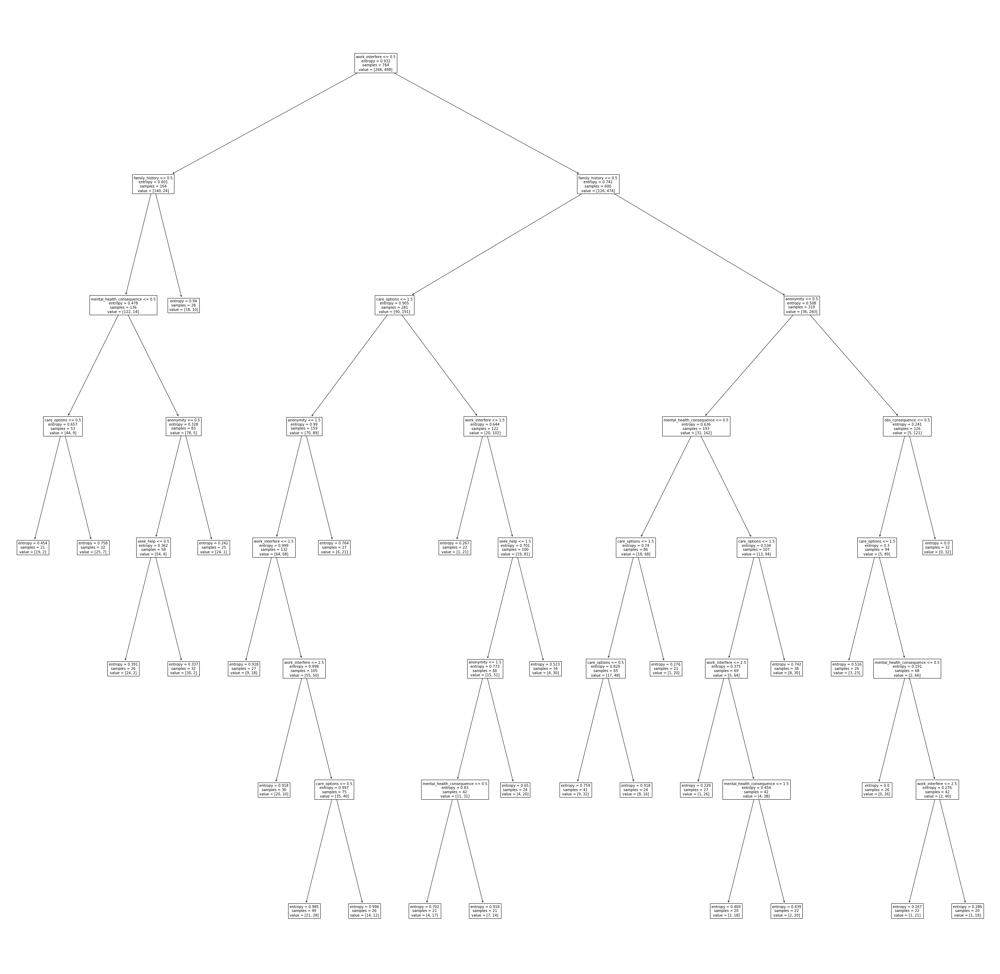

In [132]:
tree_clf_min = DecisionTreeClassifier(criterion='entropy', min_samples_leaf=20, random_state=8)
tree_clf_min.fit(tree_x_train, tree_y_train)

plt.figure(figsize=(50,50))
plot_tree(tree_clf_min, feature_names=feature_names, fontsize=10)
plt.show()

In [268]:
tree_test_min_acc = tree_clf_min.score(tree_x_test,tree_y_test)
tree_test_min_predicted = tree_clf_min.predict(tree_x_test).flatten()
tree_test_min_predicted_prob = list(tree_clf_min.predict_proba(tree_x_test).flatten())


#Calculating the confusion matrix of our classification model
tree_test_min_confusion_matrix = confusion_matrix(tree_y_test, tree_test_min_predicted)

#Calculating the null accuracy score of our data set
null_accuracy = (tree_y_test_unique[1][1]/(tree_y_test_unique[1][1]+tree_y_test_unique[1][0]))

empty_df = pd.DataFrame({'Min sample 80/20': []}).transpose()
cr = pd.DataFrame(classification_report(tree_y_test, tree_test_min_predicted, output_dict=True)).transpose()
classification_report_df = classification_report_df.append(cr)
classification_report_df = classification_report_df.append(empty_df)

print(classification_report(tree_y_test, tree_test_min_predicted))
print(f'\nConfusion matrix\n{tree_test_min_confusion_matrix}')
print(f'\nSample threshold accuracy:\n{tree_test_min_acc}')
print(f'\nNull accuracy score:\n{null_accuracy:.4f}'.format(null_accuracy))

              precision    recall  f1-score   support

         0.0       0.74      0.51      0.60        79
         1.0       0.72      0.88      0.79       112

    accuracy                           0.72       191
   macro avg       0.73      0.69      0.69       191
weighted avg       0.73      0.72      0.71       191


Confusion matrix
[[40 39]
 [14 98]]

Sample threshold accuracy:
0.7225130890052356

Null accuracy score:
0.5864


#### Changing pruning threshold

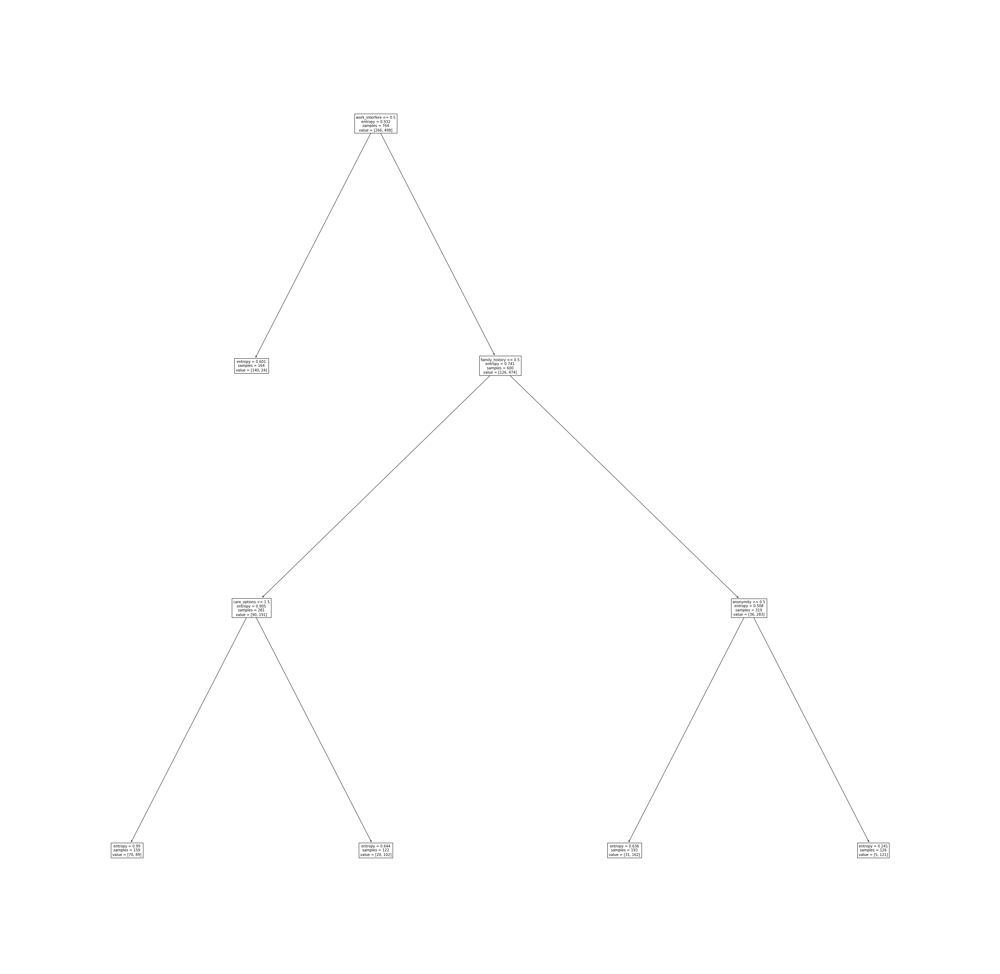

In [136]:
tree_clf_prune = DecisionTreeClassifier(criterion='entropy', ccp_alpha=0.01, random_state=8)
tree_clf_prune.fit(tree_x_train, tree_y_train)

plt.figure(figsize=(50,50))
plot_tree(tree_clf_prune, feature_names=feature_names, fontsize=10)
plt.show()

In [269]:
tree_test_prune_acc = tree_clf_prune.score(tree_x_test,tree_y_test)
tree_test_prune_predicted = tree_clf_prune.predict(tree_x_test).flatten()
tree_test_prune_predicted_prob = list(tree_clf_prune.predict_proba(tree_x_test).flatten())

#Calculating the confusion matrix of our classification model
tree_test_depth_confusion_matrix = confusion_matrix(tree_y_test, tree_test_prune_predicted)

#Calculating the null accuracy score of our data set
null_accuracy = (tree_y_test_unique[1][1]/(tree_y_test_unique[1][1]+tree_y_test_unique[1][0]))

empty_df = pd.DataFrame({'Pruning threshold 80/20': []}).transpose()
cr = pd.DataFrame(classification_report(tree_y_test, tree_test_prune_predicted, output_dict=True)).transpose()
classification_report_df = classification_report_df.append(cr)
classification_report_df = classification_report_df.append(empty_df)

print(classification_report(tree_y_test, tree_test_prune_predicted))
print(f'\nConfusion matrix\n{tree_test_depth_confusion_matrix}')
print(f'\nPruning threshold accuracy:\n{tree_test_prune_acc}')
print('\nNull accuracy score:\n{0:0.4f}'.format(null_accuracy))

              precision    recall  f1-score   support

         0.0       0.85      0.42      0.56        79
         1.0       0.70      0.95      0.80       112

    accuracy                           0.73       191
   macro avg       0.77      0.68      0.68       191
weighted avg       0.76      0.73      0.70       191


Confusion matrix
[[ 33  46]
 [  6 106]]

Pruning threshold accuracy:
0.7277486910994765

Null accuracy score:
0.5864


## New set with 30% training moved to test

### Training set 56/44 split

In [140]:
tree_x_train2, tree_x_test2, tree_y_train2, tree_y_test2 = train_test_split(tree_fs1_inputs, tree_fs1_target, 
                                                    test_size=0.44, random_state=8)

tree_clf_train2 = DecisionTreeClassifier(criterion='entropy')
tree_clf_train2.fit(tree_x_train2, tree_y_train2)

DecisionTreeClassifier(criterion='entropy')

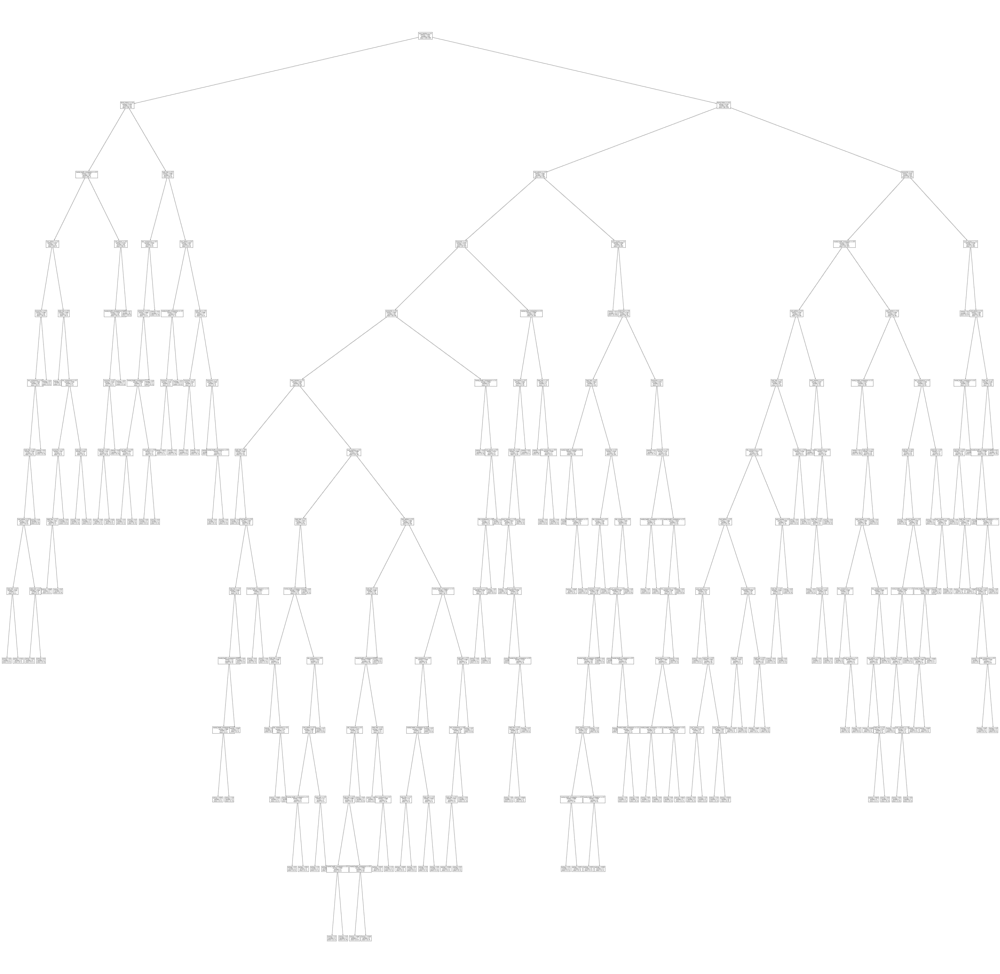

In [141]:
plt.figure(figsize=(125,125))
plot_tree(tree_clf_train2, feature_names=feature_names, fontsize=8)
plt.show()

In [142]:
tree_y_train2_unique = np.unique(tree_y_train2, return_counts=True)

In [271]:
tree_train2_acc = tree_clf_train2.score(tree_x_train2,tree_y_train2)
tree_train2_10cv = cross_val_score(tree_clf_train2, tree_x_train2, tree_y_train2, cv=10)
tree_train2_predicted = tree_clf_train2.predict(tree_x_train2).flatten()
tree_train2_predicted_prob = list(tree_clf_train2.predict_proba(tree_x_train2).flatten())

#Calculating the confusion matrix of our classification model
tree_training_confusion_matrix2 = confusion_matrix(tree_y_train2, tree_train2_predicted)

#Calculating the null accuracy score of our data set
null_accuracy = (tree_y_train2_unique[1][1]/(tree_y_train2_unique[1][1]+tree_y_train2_unique[1][0]))

empty_df = pd.DataFrame({'Train 56/44': []}).transpose()
cr = pd.DataFrame(classification_report(tree_y_train2, tree_train2_predicted, output_dict=True)).transpose()
classification_report_df = classification_report_df.append(cr)
classification_report_df = classification_report_df.append(empty_df)

print(classification_report(tree_y_train2, tree_train2_predicted))
print(f'\nConfusion matrix\n{tree_training_confusion_matrix2}')
print(f'\n56/44 split training accuracy:\n{tree_train2_acc}')
print(f'\nThe 10-fold cross-validation accuracy is:\n{tree_train2_10cv}')
print('\nNull accuracy score:\n{0:0.4f}'.format(null_accuracy))

              precision    recall  f1-score   support

         0.0       0.84      0.83      0.83       185
         1.0       0.91      0.91      0.91       349

    accuracy                           0.88       534
   macro avg       0.87      0.87      0.87       534
weighted avg       0.88      0.88      0.88       534


Confusion matrix
[[153  32]
 [ 30 319]]

56/44 split training accuracy:
0.8838951310861424

The 10-fold cross-validation accuracy is:
[0.64814815 0.59259259 0.74074074 0.7037037  0.75471698 0.67924528
 0.73584906 0.60377358 0.83018868 0.71698113]

Null accuracy score:
0.6536


### Test Set 56/44 split

In [146]:
tree_y_test2_unique = np.unique(tree_y_test2, return_counts=True)

In [273]:
tree_test2_acc = tree_clf_train2.score(tree_x_test2,tree_y_test2)
tree_test2_predicted = tree_clf_train2.predict(tree_x_test2).flatten()
tree_test2_predicted_prob = list(tree_clf_train2.predict_proba(tree_x_train2).flatten())

#Calculating the confusion matrix of our classification model
tree_testing_confusion_matrix2 = confusion_matrix(tree_y_test2, tree_test2_predicted)

#Calculating the null accuracy score of our data set
null_accuracy = (tree_y_test2_unique[1][1]/(tree_y_test2_unique[1][1]+tree_y_test2_unique[1][0]))

empty_df = pd.DataFrame({'Test 56/44': []}).transpose()
cr = pd.DataFrame(classification_report(tree_y_test2, tree_test2_predicted, output_dict=True)).transpose()
classification_report_df = classification_report_df.append(cr)
classification_report_df = classification_report_df.append(empty_df)

print(classification_report(tree_y_test2, tree_test2_predicted))
print(f'\nConfusion matrix\n{tree_testing_confusion_matrix2}')
print(f'\n56/44 split testing accuracy:\n{tree_test2_acc}')
print('\nNull accuracy score:\n{0:0.4f}'.format(null_accuracy))

              precision    recall  f1-score   support

         0.0       0.64      0.61      0.62       160
         1.0       0.77      0.79      0.78       261

    accuracy                           0.72       421
   macro avg       0.70      0.70      0.70       421
weighted avg       0.72      0.72      0.72       421


Confusion matrix
[[ 97  63]
 [ 54 207]]

56/44 split testing accuracy:
0.7220902612826603

Null accuracy score:
0.6200


## New set with 60% training moved to test

### Training Set 32/68 split

In [150]:
tree_x_train3, tree_x_test3, tree_y_train3, tree_y_test3 = train_test_split(tree_fs1_inputs, tree_fs1_target, 
                                                    test_size=0.68, random_state=8)

tree_clf_train3 = DecisionTreeClassifier(criterion='entropy')
tree_clf_train3.fit(tree_x_train3, tree_y_train3)

DecisionTreeClassifier(criterion='entropy')

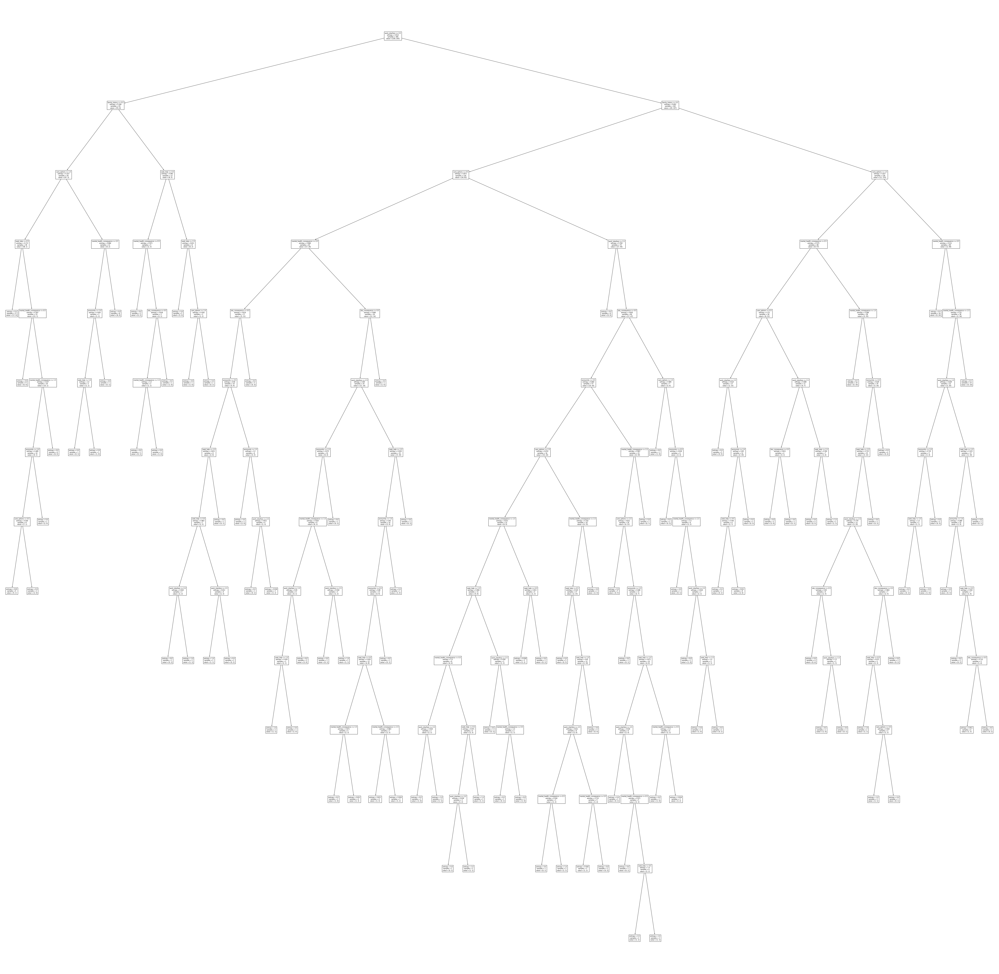

In [151]:
plt.figure(figsize=(100,100))
plot_tree(tree_clf_train3, feature_names=feature_names, fontsize=8)
plt.show()

In [152]:
tree_y_train3_unique = np.unique(tree_y_train3, return_counts=True)

In [274]:
tree_train3_acc = tree_clf_train3.score(tree_x_train3,tree_y_train3)
tree_train3_10cv = cross_val_score(tree_clf_train3, tree_x_train3, tree_y_train3, cv=10)
tree_train3_predicted = tree_clf_train3.predict(tree_x_train3).flatten()
tree_train3_predicted_prob = list(tree_clf_train3.predict_proba(tree_x_train3).flatten())

#Calculating the confusion matrix of our classification model
tree_training_confusion_matrix3 = confusion_matrix(tree_y_train3, tree_train3_predicted)

#Calculating the null accuracy score of our data set
null_accuracy = (tree_y_train3_unique[1][1]/(tree_y_train3_unique[1][1]+tree_y_train3_unique[1][0]))

empty_df = pd.DataFrame({'Train 32/68': []}).transpose()
cr = pd.DataFrame(classification_report(tree_y_train3, tree_train3_predicted, output_dict=True)).transpose()
classification_report_df = classification_report_df.append(cr)
classification_report_df = classification_report_df.append(empty_df)

print(classification_report(tree_y_train3, tree_train3_predicted))
print(f'\nConfusion matrix\n{tree_training_confusion_matrix3}')
print(f'\n32/68 split training accuracy:\n{tree_train3_acc}')
print(f'\nThe 10-fold cross-validation accuracy is:\n{tree_train3_10cv}')
print('\nNull accuracy score:\n{0:0.4f}'.format(null_accuracy))

              precision    recall  f1-score   support

         0.0       0.87      0.90      0.88       100
         1.0       0.95      0.93      0.94       205

    accuracy                           0.92       305
   macro avg       0.91      0.92      0.91       305
weighted avg       0.92      0.92      0.92       305


Confusion matrix
[[ 90  10]
 [ 14 191]]

32/68 split training accuracy:
0.921311475409836

The 10-fold cross-validation accuracy is:
[0.67741935 0.70967742 0.51612903 0.74193548 0.64516129 0.56666667
 0.76666667 0.73333333 0.73333333 0.8       ]

Null accuracy score:
0.6721


### Test Set 32/68 split

In [156]:
tree_y_test3_unique = np.unique(tree_y_test3, return_counts=True)

In [275]:
tree_test3_acc = tree_clf_train3.score(tree_x_test3,tree_y_test3)
tree_test3_predicted = tree_clf_train3.predict(tree_x_test3).flatten()
tree_test3_predicted_prob = list(tree_clf_train3.predict_proba(tree_x_test3).flatten())

#Calculating the confusion matrix of our classification model
tree_testing_confusion_matrix3 = confusion_matrix(tree_y_test3, tree_test3_predicted)

#Calculating the null accuracy score of our data set
null_accuracy = (tree_y_test3_unique[1][1]/(tree_y_test3_unique[1][1]+tree_y_test3_unique[1][0]))

empty_df = pd.DataFrame({'Test 32/68': []}).transpose()
cr = pd.DataFrame(classification_report(tree_y_test3, tree_test3_predicted, output_dict=True)).transpose()
classification_report_df = classification_report_df.append(cr)
classification_report_df = classification_report_df.append(empty_df)

print(classification_report(tree_y_test3, tree_test3_predicted))
print(f'\nConfusion matrix\n{tree_testing_confusion_matrix3}')
print(f'\n32/68 split testing accuracy:\n{tree_test3_acc}')
print('\nNull accuracy score:\n{0:0.4f}'.format(null_accuracy))

              precision    recall  f1-score   support

         0.0       0.62      0.53      0.57       245
         1.0       0.74      0.80      0.77       405

    accuracy                           0.70       650
   macro avg       0.68      0.67      0.67       650
weighted avg       0.70      0.70      0.70       650


Confusion matrix
[[131 114]
 [ 80 325]]

32/68 split testing accuracy:
0.7015384615384616

Null accuracy score:
0.6231


### Accuracy comparison of different methods

Default training accuracy: 0.8808900523560209
Default testing accuracy: 0.6544502617801047
Random split accuracy: 0.643979057591623
Max depth accuracy: 0.6701570680628273
Sample threshold accuracy: 0.7225130890052356
Pruning threshold accuracy: 0.7277486910994765
56/44 split training accuracy: 0.8838951310861424
56/44 split testing accuracy: 0.7220902612826603
32/68 split training accuracy: 0.921311475409836
32/68 split testing accuracy: 0.7015384615384616


[Text(0, 0, 'tree_train_acc'),
 Text(0, 0, 'tree_test_acc'),
 Text(0, 0, 'tree_test_split_acc'),
 Text(0, 0, 'tree_test_depth_acc'),
 Text(0, 0, 'tree_test_min_acc'),
 Text(0, 0, 'tree_test_prune_acc'),
 Text(0, 0, 'tree_train2_acc'),
 Text(0, 0, 'tree_test2_acc'),
 Text(0, 0, 'tree_train3_acc'),
 Text(0, 0, 'tree_test3_acc')]

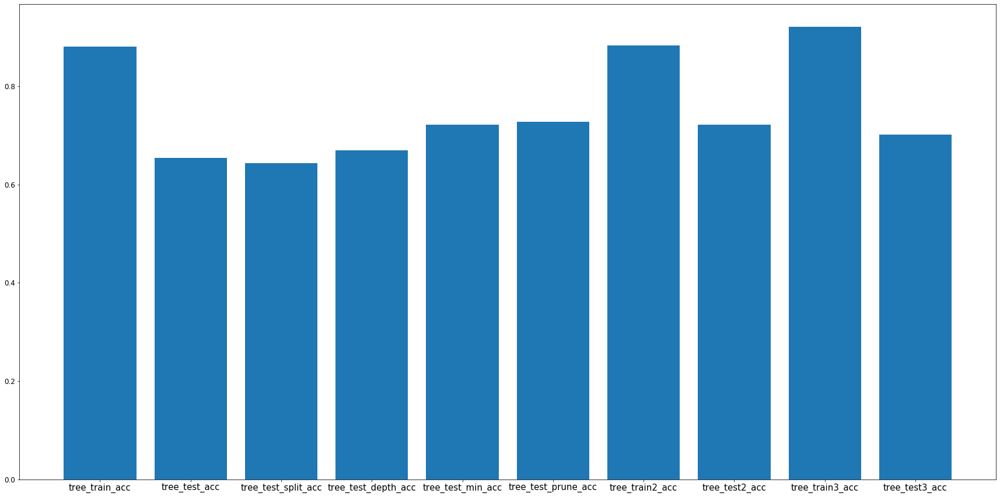

In [360]:
accuracies = [tree_train_acc, tree_test_acc, tree_test_split_acc, tree_test_depth_acc,
              tree_test_min_acc, tree_test_prune_acc, tree_train2_acc, tree_test2_acc, 
              tree_train3_acc, tree_test3_acc]
accuracies_labels = ["tree_train_acc", "tree_test_acc", "tree_test_split_acc", "tree_test_depth_acc",
              "tree_test_min_acc", "tree_test_prune_acc", "tree_train2_acc", "tree_test2_acc", 
              "tree_train3_acc", "tree_test3_acc"]

print(f'Default training accuracy: {tree_train_acc}')
print(f'Default testing accuracy: {tree_test_acc}')
print(f'Random split accuracy: {tree_test_split_acc}')
print(f'Max depth accuracy: {tree_test_depth_acc}')
print(f'Sample threshold accuracy: {tree_test_min_acc}')
print(f'Pruning threshold accuracy: {tree_test_prune_acc}')
print(f'56/44 split training accuracy: {tree_train2_acc}')
print(f'56/44 split testing accuracy: {tree_test2_acc}')
print(f'32/68 split training accuracy: {tree_train3_acc}')
print(f'32/68 split testing accuracy: {tree_test3_acc}')

xticks=np.arange(len(accuracies))
fig, ax = plt.subplots(1, figsize=(30,15))
ax.bar(xticks, accuracies)
ax.set_xticks(xticks)
ax.set_xticklabels(accuracies_labels, fontsize=15)

## Applying random forest classifier to Data

In [162]:
rfc_x_train, rfc_x_test, rfc_y_train, rfc_y_test = train_test_split(tree_fs1_inputs, tree_fs1_target, 
                                                    test_size=0.2, random_state=8)
rfc = RandomForestClassifier()
rfc.fit(rfc_x_train, rfc_y_train)

C:\Users\kikan\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


RandomForestClassifier()

In [163]:
plt.figure(figsize = (50,50), dpi=500)
plot_tree(rfc.estimators_[0], feature_names = feature_names, filled = True, fontsize=1)

[Text(10598.99371603261, 18200.89285714286, 'anonymity <= 1.5\ngini = 0.446\nsamples = 494\nvalue = [257, 507]'),
 Text(5658.876407220498, 16852.678571428572, 'work_interfere <= 0.5\ngini = 0.471\nsamples = 349\nvalue = [207, 337]'),
 Text(2090.9355590062114, 15504.464285714286, 'mental_health_consequence <= 0.5\ngini = 0.181\nsamples = 83\nvalue = [107, 12]'),
 Text(1534.3555900621118, 14156.25, 'seek_help <= 1.5\ngini = 0.306\nsamples = 37\nvalue = [43, 10]'),
 Text(1143.245341614907, 12808.035714285714, 'care_options <= 1.5\ngini = 0.249\nsamples = 34\nvalue = [41, 7]'),
 Text(722.0496894409938, 11459.821428571428, 'seek_help <= 0.5\ngini = 0.184\nsamples = 29\nvalue = [35, 4]'),
 Text(481.3664596273292, 10111.607142857143, 'care_options <= 0.5\ngini = 0.32\nsamples = 10\nvalue = [12, 3]'),
 Text(361.0248447204969, 8763.392857142857, 'obs_consequence <= 0.5\ngini = 0.32\nsamples = 4\nvalue = [4, 1]'),
 Text(240.6832298136646, 7415.178571428571, 'family_history <= 0.5\ngini = 0.375\n

In [164]:
rfc_test_acc = rfc.score(rfc_x_test,rfc_y_test)
rfc_test_predicted = rfc.predict(rfc_x_test).flatten()
rfc_test_predicted_prob = list(rfc.predict_proba(tree_x_test3).flatten())

print(f'Random Forest Classifier accuracy:\n{rfc_test_acc}')

Random Forest Classifier accuracy:
0.675392670157068


In [165]:
rfc_y_test_count = np.unique(rfc_y_test, return_counts=True)

In [166]:
#Calculating the confusion matrix of our classification model
rfc_testing_confusion_matrix = confusion_matrix(rfc_y_test, rfc_test_predicted)

#Setting the different model performance metrics
TP = rfc_testing_confusion_matrix[0,0]
TN = rfc_testing_confusion_matrix[1,1]
FP = rfc_testing_confusion_matrix[0,1]
FN = rfc_testing_confusion_matrix[1,0]

#Calculating the null accuracy score of our data set
null_accuracy = (rfc_y_test_count[1][1]/(rfc_y_test_count[1][1]+rfc_y_test_count[1][0]))

print('Null accuracy score:\n{0:0.4f}'.format(null_accuracy))
print(f'\nConfusion matrix\n{rfc_testing_confusion_matrix}')
print(f'\nTrue Positives(TP) = {TP}')
print(f'\nTrue Negatives(TN) = {TN}')
print(f'\nFalse Positives(FP) = {FP}')
print(f'\nFalse Negatives(FN) = {FN}')

Null accuracy score:
0.5864

Confusion matrix
[[36 43]
 [19 93]]

True Positives(TP) = 36

True Negatives(TN) = 93

False Positives(FP) = 43

False Negatives(FN) = 19


In [167]:
#Calculating the precision, TP_rate, f-score and support of the model

#The accuracy of the classification
classification_accuracy = (TP + TN) / float(TP + TN + FP + FN)

#The error of the classification
classification_error = (FP + FN) / float(TP + TN + FP + FN)

#The precision of the classification
precision = TP / float(TP + FP)

#The True Postivie Rate (Recall)
TP_rate = TP / float(TP + FN)

#The False Positive Rate
FP_rate = FP / float(FP+TN)

print(classification_report(rfc_y_test, rfc_test_predicted))
print('Classification accuracy : {0:0.4f}'.format(classification_accuracy))
print('Classification error : {0:0.4f}'.format(classification_error))
print('Precision : {0:0.4f}'.format(precision))
print('TP_Rate : {0:0.4f}'.format(TP_rate))
print('FP_Rate : {0:0.4f}'.format(FP_rate))

              precision    recall  f1-score   support

         0.0       0.65      0.46      0.54        79
         1.0       0.68      0.83      0.75       112

    accuracy                           0.68       191
   macro avg       0.67      0.64      0.64       191
weighted avg       0.67      0.68      0.66       191

Classification accuracy : 0.6754
Classification error : 0.3246
Precision : 0.4557
TP_Rate : 0.6545
FP_Rate : 0.3162


# Applying Neural Network to Data

### Code has been adapted from https://github.com/ageron/handson-ml2

In [168]:
import tensorflow as tf
assert tf.__version__ >= "2.0"

In [169]:
from sklearn.linear_model import Perceptron

In [361]:
nn_fs1 = read_data('Health Survey Encoded.xlsx', sheetname='Feature Selection 1')
nn_fs1_inputs = nn_fs1.drop(['treatment'], axis='columns')
nn_fs1_targets = nn_fs1[['treatment']]


## Applying a linear classifier to Data

In [171]:
nn_x_train, nn_x_test, nn_y_train, nn_y_test = train_test_split(nn_fs1_inputs, 
                                                                nn_fs1_targets,
                                                                test_size=0.3,
                                                                random_state = 8)

nn_y_train = (nn_y_train==0).to_numpy().flatten().astype(np.int)
nn_y_test = (nn_y_test==0).to_numpy().flatten().astype(np.int)
per_clf = Perceptron(max_iter=1000, tol=1e-3, random_state=8)
per_clf.fit(nn_x_train.iloc[:,2:4], nn_y_train)

Perceptron(random_state=8)

In [172]:
nn_x_train

,anonymity,obs_consequence,work_interfere,family_history,care_options,seek_help,mental_health_consequence
1176,0.0,0.0,2.0,1.0,0.0,1.0,0.0
657,0.0,0.0,0.0,0.0,0.0,1.0,1.0
439,2.0,0.0,2.0,1.0,2.0,2.0,1.0
904,2.0,0.0,0.0,0.0,2.0,1.0,1.0
947,0.0,0.0,2.0,0.0,2.0,2.0,1.0
861,0.0,0.0,2.0,0.0,1.0,0.0,1.0
1071,0.0,0.0,3.0,0.0,1.0,2.0,0.0
553,2.0,0.0,3.0,0.0,2.0,1.0,0.0
579,0.0,0.0,3.0,1.0,0.0,1.0,0.0
585,0.0,0.0,0.0,0.0,1.0,1.0,0.0


In [173]:
y_pred = per_clf.predict(nn_x_train.iloc[:,:2])
y_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [174]:
# -per_clf.coef_
-per_clf.intercept_

array([-3.])

In [175]:
nn_x_train.iloc[:,3:5]

,family_history,care_options
1176,1.0,0.0
657,0.0,0.0
439,1.0,2.0
904,0.0,2.0
947,0.0,2.0
861,0.0,1.0
1071,0.0,1.0
553,0.0,2.0
579,1.0,0.0
585,0.0,1.0


In [176]:
#Checking accuracy on training set
per_clf.score(nn_x_train.iloc[:,3:5], nn_y_train)

0.344311377245509

In [177]:
#Checking accuracy on test set
per_clf.score(nn_x_test.iloc[:,3:5], nn_y_test)

0.40069686411149824

In [362]:
#Calculating 10-fold cross evaluation on training set
cv_score = cross_val_score(per_clf, nn_x_train, nn_y_train, cv=10)
cv_score

C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\kikan\Anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

array([0.79411765, 0.70588235, 0.67647059, 0.67647059, 0.78787879,
       0.81818182, 0.72727273, 0.81818182, 0.84848485, 0.78787879])

## Applying MLP to Data

In [319]:
from tensorflow import keras

In [320]:
nn_x_train_full, nn_x_test, nn_y_train_full, nn_y_test = train_test_split(nn_fs1_inputs, 
                                                                nn_fs1_targets,
                                                                test_size=0.3,
                                                                random_state = 8)

In [321]:
nn_x_train.shape

(334, 7)

In [322]:
#Splitting training set into training and validation subsets
nn_x_valid, nn_x_train = nn_x_train_full[:334], nn_x_train_full[334:]
nn_y_valid, nn_y_train = nn_y_train_full[:334], nn_y_train_full[334:]

# Model 1 Baseline

In [323]:
#Creating MLP with 2 hidden layers
mlp_model1 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[7]),
    keras.layers.Dense(200, activation='relu'),
    keras.layers.Dense(50, activation='relu'),
    keras.layers.Dense(10, activation='softmax')
])

In [324]:
mlp_model1.layers

In [325]:
#Looking at summary of model
mlp_model1.summary()

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_22 (Flatten)        (None, 7)                 0         
                                                                 
 dense_68 (Dense)            (None, 200)               1600      
                                                                 
 dense_69 (Dense)            (None, 50)                10050     
                                                                 
 dense_70 (Dense)            (None, 10)                510       
                                                                 
Total params: 12,160
Trainable params: 12,160
Non-trainable params: 0
_________________________________________________________________


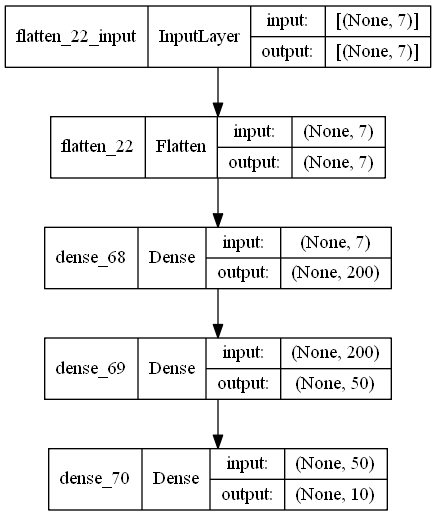

In [326]:
keras.utils.plot_model(mlp_model1, 'boop.png', show_shapes=True)

In [327]:
layer1 = mlp_model1.layers[1]
layer1

In [328]:
weights, biases = layer1.get_weights()
# weights
# biases.shape

In [329]:
#Configuring the model for training
mlp_model1.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.SGD(learning_rate=0.01),
              metrics=[keras.metrics.sparse_categorical_accuracy])

In [330]:
#Training the model on training subset and then validating it on other half of training set
history1 = mlp_model1.fit(nn_x_train, nn_y_train, epochs=30,
                    validation_data=(nn_x_valid, nn_y_valid))

Epoch 1/30
11/11 [==============================] - 0s 17ms/step - loss: 2.0448 - sparse_categorical_accuracy: 0.3683 - val_loss: 1.6600 - val_sparse_categorical_accuracy: 0.6497
Epoch 2/30
11/11 [==============================] - 0s 4ms/step - loss: 1.4471 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.2467 - val_sparse_categorical_accuracy: 0.6497
Epoch 3/30
11/11 [==============================] - 0s 4ms/step - loss: 1.1345 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.0639 - val_sparse_categorical_accuracy: 0.6497
Epoch 4/30
11/11 [==============================] - 0s 4ms/step - loss: 0.9844 - sparse_categorical_accuracy: 0.6617 - val_loss: 0.9577 - val_sparse_categorical_accuracy: 0.6497
Epoch 5/30
11/11 [==============================] - 0s 3ms/step - loss: 0.8907 - sparse_categorical_accuracy: 0.6617 - val_loss: 0.8842 - val_sparse_categorical_accuracy: 0.6497
Epoch 6/30
11/11 [==============================] - 0s 4ms/step - loss: 0.8238 - sparse_categorical_accuracy:

In [331]:
history1.params

{'verbose': 1, 'epochs': 30, 'steps': 11}

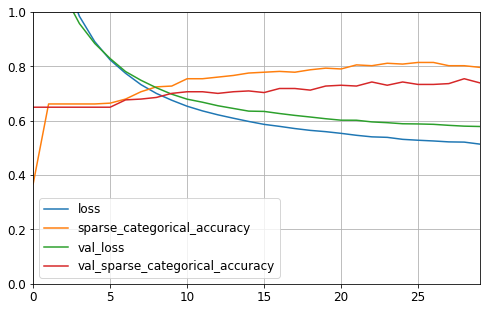

In [332]:
#Plotting results of the training for the model
pd.DataFrame(history1.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

In [333]:
#Storing a history of the accuracies and loses for each model evaluated against the test set
model_accuracies = []
model_loses = []
model_accuracies.append(mlp_model1.evaluate(nn_x_test, nn_y_test)[1])
model_loses.append(mlp_model1.evaluate(nn_x_test, nn_y_test)[0])

9/9 [==============================] - 0s 732us/step - loss: 0.6232 - sparse_categorical_accuracy: 0.7178


# Model 2 Changing nodes per layer

In [334]:
mlp_model2 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[7]),
    keras.layers.Dense(500, activation='relu'),
    keras.layers.Dense(200, activation='relu'),
    keras.layers.Dense(10, activation='softmax')
])
mlp_model2.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.SGD(),
              metrics=[keras.metrics.sparse_categorical_accuracy]
)
history2 = mlp_model2.fit(nn_x_train, nn_y_train, epochs=30,
                    validation_data=(nn_x_valid, nn_y_valid)
)
model_accuracies.append(mlp_model2.evaluate(nn_x_test, nn_y_test)[1])
model_loses.append(mlp_model2.evaluate(nn_x_test, nn_y_test)[0])

Epoch 1/30
11/11 [==============================] - 0s 18ms/step - loss: 1.8114 - sparse_categorical_accuracy: 0.6557 - val_loss: 1.5054 - val_sparse_categorical_accuracy: 0.6497
Epoch 2/30
11/11 [==============================] - 0s 4ms/step - loss: 1.3420 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.1740 - val_sparse_categorical_accuracy: 0.6497
Epoch 3/30
11/11 [==============================] - 0s 3ms/step - loss: 1.0819 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.0110 - val_sparse_categorical_accuracy: 0.6497
Epoch 4/30
11/11 [==============================] - 0s 3ms/step - loss: 0.9467 - sparse_categorical_accuracy: 0.6617 - val_loss: 0.9101 - val_sparse_categorical_accuracy: 0.6497
Epoch 5/30
11/11 [==============================] - 0s 3ms/step - loss: 0.8572 - sparse_categorical_accuracy: 0.6617 - val_loss: 0.8399 - val_sparse_categorical_accuracy: 0.6497
Epoch 6/30
11/11 [==============================] - 0s 4ms/step - loss: 0.7923 - sparse_categorical_accuracy:

# Model 3 Changing learning rate

In [335]:
mlp_model3 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[7]),
    keras.layers.Dense(200, activation='relu'),
    keras.layers.Dense(50, activation='relu'),
    keras.layers.Dense(10, activation='softmax')
])
mlp_model3.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.SGD(learning_rate=0.02),
              metrics=[keras.metrics.sparse_categorical_accuracy]
)
history3 = mlp_model3.fit(nn_x_train, nn_y_train, epochs=30,
                    validation_data=(nn_x_valid, nn_y_valid)
)
model_accuracies.append(mlp_model3.evaluate(nn_x_test, nn_y_test)[1])
model_loses.append(mlp_model3.evaluate(nn_x_test, nn_y_test)[0])

Epoch 1/30
11/11 [==============================] - 0s 18ms/step - loss: 1.8516 - sparse_categorical_accuracy: 0.4760 - val_loss: 1.3637 - val_sparse_categorical_accuracy: 0.6497
Epoch 2/30
11/11 [==============================] - 0s 3ms/step - loss: 1.1712 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.0268 - val_sparse_categorical_accuracy: 0.6497
Epoch 3/30
11/11 [==============================] - 0s 3ms/step - loss: 0.9329 - sparse_categorical_accuracy: 0.6617 - val_loss: 0.8838 - val_sparse_categorical_accuracy: 0.6497
Epoch 4/30
11/11 [==============================] - 0s 3ms/step - loss: 0.8135 - sparse_categorical_accuracy: 0.6617 - val_loss: 0.7965 - val_sparse_categorical_accuracy: 0.6497
Epoch 5/30
11/11 [==============================] - 0s 3ms/step - loss: 0.7380 - sparse_categorical_accuracy: 0.6647 - val_loss: 0.7358 - val_sparse_categorical_accuracy: 0.6557
Epoch 6/30
11/11 [==============================] - 0s 4ms/step - loss: 0.6887 - sparse_categorical_accuracy:

# Model 4 Changing number of layers

In [336]:
mlp_model4 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[7]),
    keras.layers.Dense(1000, activation='relu'),
    keras.layers.Dense(200, activation='relu'),
    keras.layers.Dense(50, activation='relu'),
    keras.layers.Dense(10, activation='softmax')
])
mlp_model4.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.SGD(),
              metrics=[keras.metrics.sparse_categorical_accuracy]
)
history4 = mlp_model4.fit(nn_x_train, nn_y_train, epochs=30,
                    validation_data=(nn_x_valid, nn_y_valid)
)
model_accuracies.append(mlp_model4.evaluate(nn_x_test, nn_y_test)[1])
model_loses.append(mlp_model4.evaluate(nn_x_test, nn_y_test)[0])

Epoch 1/30
11/11 [==============================] - 0s 19ms/step - loss: 2.1612 - sparse_categorical_accuracy: 0.4551 - val_loss: 1.9789 - val_sparse_categorical_accuracy: 0.6497
Epoch 2/30
11/11 [==============================] - 0s 4ms/step - loss: 1.8385 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.6636 - val_sparse_categorical_accuracy: 0.6497
Epoch 3/30
11/11 [==============================] - 0s 4ms/step - loss: 1.5198 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.3711 - val_sparse_categorical_accuracy: 0.6497
Epoch 4/30
11/11 [==============================] - 0s 4ms/step - loss: 1.2509 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.1606 - val_sparse_categorical_accuracy: 0.6497
Epoch 5/30
11/11 [==============================] - 0s 4ms/step - loss: 1.0707 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.0280 - val_sparse_categorical_accuracy: 0.6497
Epoch 6/30
11/11 [==============================] - 0s 4ms/step - loss: 0.9511 - sparse_categorical_accuracy:

# Model 5 Changing activation function (sigmoid)

In [337]:
mlp_model5 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[7]),
    keras.layers.Dense(200, activation='sigmoid'),
    keras.layers.Dense(50, activation='sigmoid'),
    keras.layers.Dense(10, activation='softmax')
])
mlp_model5.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.SGD(),
              metrics=[keras.metrics.sparse_categorical_accuracy]
)
history5 = mlp_model5.fit(nn_x_train, nn_y_train, epochs=30,
                    validation_data=(nn_x_valid, nn_y_valid)
)
model_accuracies.append(mlp_model5.evaluate(nn_x_test, nn_y_test)[1])
model_loses.append(mlp_model5.evaluate(nn_x_test, nn_y_test)[0])

Epoch 1/30
11/11 [==============================] - 0s 16ms/step - loss: 1.7495 - sparse_categorical_accuracy: 0.4042 - val_loss: 1.4224 - val_sparse_categorical_accuracy: 0.6497
Epoch 2/30
11/11 [==============================] - 0s 3ms/step - loss: 1.2662 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.1271 - val_sparse_categorical_accuracy: 0.6497
Epoch 3/30
11/11 [==============================] - 0s 3ms/step - loss: 1.0462 - sparse_categorical_accuracy: 0.6617 - val_loss: 0.9802 - val_sparse_categorical_accuracy: 0.6497
Epoch 4/30
11/11 [==============================] - 0s 3ms/step - loss: 0.9292 - sparse_categorical_accuracy: 0.6617 - val_loss: 0.8942 - val_sparse_categorical_accuracy: 0.6497
Epoch 5/30
11/11 [==============================] - 0s 3ms/step - loss: 0.8578 - sparse_categorical_accuracy: 0.6617 - val_loss: 0.8373 - val_sparse_categorical_accuracy: 0.6497
Epoch 6/30
11/11 [==============================] - 0s 3ms/step - loss: 0.8099 - sparse_categorical_accuracy:

# Model 6 Changing activation function (tanh)

In [338]:
mlp_model6 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[7]),
    keras.layers.Dense(200, activation='tanh'),
    keras.layers.Dense(50, activation='tanh'),
    keras.layers.Dense(10, activation='softmax')
])
mlp_model6.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.SGD(),
              metrics=[keras.metrics.sparse_categorical_accuracy]
)
history6 = mlp_model6.fit(nn_x_train, nn_y_train, epochs=30,
                    validation_data=(nn_x_valid, nn_y_valid)
)
model_accuracies.append(mlp_model6.evaluate(nn_x_test, nn_y_test)[1])
model_loses.append(mlp_model6.evaluate(nn_x_test, nn_y_test)[0])

Epoch 1/30
11/11 [==============================] - 1s 18ms/step - loss: 1.7787 - sparse_categorical_accuracy: 0.4401 - val_loss: 1.2276 - val_sparse_categorical_accuracy: 0.6377
Epoch 2/30
11/11 [==============================] - 0s 3ms/step - loss: 1.0796 - sparse_categorical_accuracy: 0.6557 - val_loss: 0.9662 - val_sparse_categorical_accuracy: 0.6527
Epoch 3/30
11/11 [==============================] - 0s 3ms/step - loss: 0.8953 - sparse_categorical_accuracy: 0.6886 - val_loss: 0.8621 - val_sparse_categorical_accuracy: 0.6527
Epoch 4/30
11/11 [==============================] - 0s 3ms/step - loss: 0.8046 - sparse_categorical_accuracy: 0.6916 - val_loss: 0.7998 - val_sparse_categorical_accuracy: 0.6677
Epoch 5/30
11/11 [==============================] - 0s 3ms/step - loss: 0.7491 - sparse_categorical_accuracy: 0.7126 - val_loss: 0.7565 - val_sparse_categorical_accuracy: 0.7006
Epoch 6/30
11/11 [==============================] - 0s 3ms/step - loss: 0.7063 - sparse_categorical_accuracy:

# Model 7 Changing model optimizer

In [339]:
mlp_model7 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[7]),
    keras.layers.Dense(200, activation='relu'),
    keras.layers.Dense(50, activation='relu'),
    keras.layers.Dense(10, activation='softmax')
])
mlp_model7.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.Adam(),
              metrics=[keras.metrics.sparse_categorical_accuracy]
)
history7 = mlp_model7.fit(nn_x_train, nn_y_train, epochs=30,
                    validation_data=(nn_x_valid, nn_y_valid)
)
model_accuracies.append(mlp_model7.evaluate(nn_x_test, nn_y_test)[1])
model_loses.append(mlp_model7.evaluate(nn_x_test, nn_y_test)[0])

Epoch 1/30
11/11 [==============================] - 0s 17ms/step - loss: 1.8458 - sparse_categorical_accuracy: 0.4940 - val_loss: 1.3730 - val_sparse_categorical_accuracy: 0.6497
Epoch 2/30
11/11 [==============================] - 0s 4ms/step - loss: 1.1224 - sparse_categorical_accuracy: 0.6617 - val_loss: 0.9387 - val_sparse_categorical_accuracy: 0.6497
Epoch 3/30
11/11 [==============================] - 0s 4ms/step - loss: 0.7565 - sparse_categorical_accuracy: 0.6946 - val_loss: 0.6836 - val_sparse_categorical_accuracy: 0.7575
Epoch 4/30
11/11 [==============================] - 0s 3ms/step - loss: 0.5968 - sparse_categorical_accuracy: 0.8174 - val_loss: 0.6099 - val_sparse_categorical_accuracy: 0.7665
Epoch 5/30
11/11 [==============================] - 0s 3ms/step - loss: 0.5279 - sparse_categorical_accuracy: 0.8204 - val_loss: 0.5788 - val_sparse_categorical_accuracy: 0.7635
Epoch 6/30
11/11 [==============================] - 0s 3ms/step - loss: 0.4969 - sparse_categorical_accuracy:

# Model 8 Changing epochs

In [340]:
mlp_model8 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[7]),
    keras.layers.Dense(200, activation='relu'),
    keras.layers.Dense(50, activation='relu'),
    keras.layers.Dense(10, activation='softmax')
])
mlp_model8.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.SGD(),
              metrics=[keras.metrics.sparse_categorical_accuracy]
)
history8 = mlp_model8.fit(nn_x_train, nn_y_train, epochs=100,
                    validation_data=(nn_x_valid, nn_y_valid)
)
model_accuracies.append(mlp_model8.evaluate(nn_x_test, nn_y_test)[1])
model_loses.append(mlp_model8.evaluate(nn_x_test, nn_y_test)[0])

Epoch 1/100
11/11 [==============================] - 0s 16ms/step - loss: 2.2925 - sparse_categorical_accuracy: 0.0719 - val_loss: 2.0905 - val_sparse_categorical_accuracy: 0.4521
Epoch 2/100
11/11 [==============================] - 0s 3ms/step - loss: 1.9607 - sparse_categorical_accuracy: 0.6287 - val_loss: 1.7933 - val_sparse_categorical_accuracy: 0.6527
Epoch 3/100
11/11 [==============================] - 0s 3ms/step - loss: 1.6652 - sparse_categorical_accuracy: 0.7006 - val_loss: 1.5004 - val_sparse_categorical_accuracy: 0.6587
Epoch 4/100
11/11 [==============================] - 0s 3ms/step - loss: 1.3776 - sparse_categorical_accuracy: 0.6647 - val_loss: 1.2292 - val_sparse_categorical_accuracy: 0.6497
Epoch 5/100
11/11 [==============================] - 0s 3ms/step - loss: 1.1331 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.0457 - val_sparse_categorical_accuracy: 0.6497
Epoch 6/100
11/11 [==============================] - 0s 3ms/step - loss: 0.9774 - sparse_categorical_acc

11/11 [==============================] - 0s 3ms/step - loss: 0.4993 - sparse_categorical_accuracy: 0.8174 - val_loss: 0.5658 - val_sparse_categorical_accuracy: 0.7545
Epoch 47/100
11/11 [==============================] - 0s 3ms/step - loss: 0.4999 - sparse_categorical_accuracy: 0.8204 - val_loss: 0.5690 - val_sparse_categorical_accuracy: 0.7455
Epoch 48/100
11/11 [==============================] - 0s 3ms/step - loss: 0.4978 - sparse_categorical_accuracy: 0.8204 - val_loss: 0.5643 - val_sparse_categorical_accuracy: 0.7485
Epoch 49/100
11/11 [==============================] - 0s 3ms/step - loss: 0.4937 - sparse_categorical_accuracy: 0.8024 - val_loss: 0.5699 - val_sparse_categorical_accuracy: 0.7455
Epoch 50/100
11/11 [==============================] - 0s 3ms/step - loss: 0.4941 - sparse_categorical_accuracy: 0.8114 - val_loss: 0.5762 - val_sparse_categorical_accuracy: 0.7455
Epoch 51/100
11/11 [==============================] - 0s 3ms/step - loss: 0.4930 - sparse_categorical_accuracy: 0

11/11 [==============================] - 0s 3ms/step - loss: 0.4512 - sparse_categorical_accuracy: 0.8084 - val_loss: 0.5422 - val_sparse_categorical_accuracy: 0.7635
Epoch 92/100
11/11 [==============================] - 0s 3ms/step - loss: 0.4492 - sparse_categorical_accuracy: 0.8084 - val_loss: 0.5432 - val_sparse_categorical_accuracy: 0.7635
Epoch 93/100
11/11 [==============================] - 0s 4ms/step - loss: 0.4456 - sparse_categorical_accuracy: 0.8114 - val_loss: 0.5530 - val_sparse_categorical_accuracy: 0.7365
Epoch 94/100
11/11 [==============================] - 0s 3ms/step - loss: 0.4547 - sparse_categorical_accuracy: 0.8114 - val_loss: 0.5429 - val_sparse_categorical_accuracy: 0.7575
Epoch 95/100
11/11 [==============================] - 0s 3ms/step - loss: 0.4504 - sparse_categorical_accuracy: 0.8174 - val_loss: 0.5395 - val_sparse_categorical_accuracy: 0.7635
Epoch 96/100
11/11 [==============================] - 0s 3ms/step - loss: 0.4455 - sparse_categorical_accuracy: 0

# Model 9 Changing validation threshold to 25%

In [341]:
nn_x_valid2, nn_x_train2 = nn_x_train_full[:501], nn_x_train_full[501:]
nn_y_valid2, nn_y_train2 = nn_y_train_full[:501], nn_y_train_full[501:]

mlp_model9 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[7]),
    keras.layers.Dense(200, activation='relu'),
    keras.layers.Dense(50, activation='relu'),
    keras.layers.Dense(10, activation='softmax')
])
mlp_model9.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.SGD(),
              metrics=[keras.metrics.sparse_categorical_accuracy]
)
history9 = mlp_model9.fit(nn_x_train, nn_y_train, epochs=30,
                    validation_data=(nn_x_valid2, nn_y_valid2)
)
model_accuracies.append(mlp_model9.evaluate(nn_x_test, nn_y_test)[1])
model_loses.append(mlp_model9.evaluate(nn_x_test, nn_y_test)[0])

Epoch 1/30
11/11 [==============================] - 0s 18ms/step - loss: 1.9491 - sparse_categorical_accuracy: 0.5240 - val_loss: 1.5788 - val_sparse_categorical_accuracy: 0.6607
Epoch 2/30
11/11 [==============================] - 0s 4ms/step - loss: 1.4031 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.2024 - val_sparse_categorical_accuracy: 0.6607
Epoch 3/30
11/11 [==============================] - 0s 4ms/step - loss: 1.1127 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.0160 - val_sparse_categorical_accuracy: 0.6607
Epoch 4/30
11/11 [==============================] - 0s 4ms/step - loss: 0.9630 - sparse_categorical_accuracy: 0.6617 - val_loss: 0.9108 - val_sparse_categorical_accuracy: 0.6607
Epoch 5/30
11/11 [==============================] - 0s 4ms/step - loss: 0.8724 - sparse_categorical_accuracy: 0.6617 - val_loss: 0.8412 - val_sparse_categorical_accuracy: 0.6607
Epoch 6/30
11/11 [==============================] - 0s 4ms/step - loss: 0.8094 - sparse_categorical_accuracy:

# Model 10 Changing validation threshold to 75%

In [342]:
nn_x_valid3, nn_x_train3 = nn_x_train_full[:167], nn_x_train_full[167:]
nn_y_valid3, nn_y_train3 = nn_y_train_full[:167], nn_y_train_full[167:]

mlp_model10 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[7]),
    keras.layers.Dense(200, activation='relu'),
    keras.layers.Dense(50, activation='relu'),
    keras.layers.Dense(10, activation='softmax')
])
mlp_model10.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.SGD(),
              metrics=[keras.metrics.sparse_categorical_accuracy]
)
history10 = mlp_model10.fit(nn_x_train, nn_y_train, epochs=30,
                    validation_data=(nn_x_valid3, nn_y_valid3)
)
model_accuracies.append(mlp_model10.evaluate(nn_x_test, nn_y_test)[1])
model_loses.append(mlp_model10.evaluate(nn_x_test, nn_y_test)[0])

Epoch 1/30
11/11 [==============================] - 0s 16ms/step - loss: 2.2447 - sparse_categorical_accuracy: 0.1078 - val_loss: 1.8715 - val_sparse_categorical_accuracy: 0.5509
Epoch 2/30
11/11 [==============================] - 0s 3ms/step - loss: 1.6760 - sparse_categorical_accuracy: 0.6587 - val_loss: 1.4366 - val_sparse_categorical_accuracy: 0.6287
Epoch 3/30
11/11 [==============================] - 0s 3ms/step - loss: 1.3025 - sparse_categorical_accuracy: 0.6587 - val_loss: 1.1594 - val_sparse_categorical_accuracy: 0.6347
Epoch 4/30
11/11 [==============================] - 0s 3ms/step - loss: 1.0749 - sparse_categorical_accuracy: 0.6617 - val_loss: 1.0048 - val_sparse_categorical_accuracy: 0.6347
Epoch 5/30
11/11 [==============================] - 0s 3ms/step - loss: 0.9456 - sparse_categorical_accuracy: 0.6617 - val_loss: 0.9089 - val_sparse_categorical_accuracy: 0.6347
Epoch 6/30
11/11 [==============================] - 0s 3ms/step - loss: 0.8626 - sparse_categorical_accuracy:

# Plotting all the models

Text(0.5, 1.0, 'Model 10 75%')

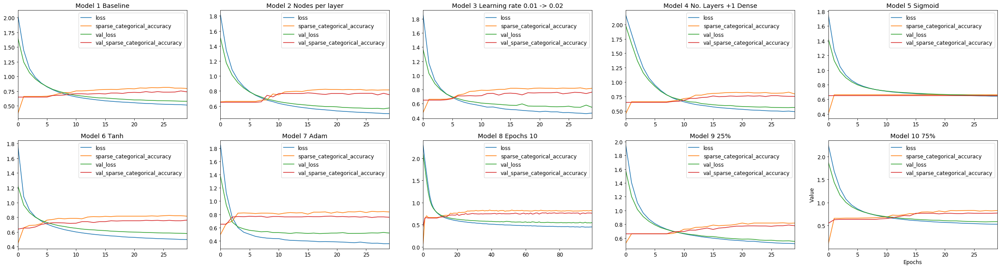

In [343]:
fig, axs = plt.subplots(2, 5, figsize=(40,10))
plt.grid(True)
plt.xlabel('Epochs')
plt.ylabel('Value')
pd.DataFrame(history1.history).plot(ax=axs[0,0])
axs[0,0].set_title('Model 1 Baseline')
pd.DataFrame(history2.history).plot(ax=axs[0,1])
axs[0,1].set_title('Model 2 Nodes per layer')
pd.DataFrame(history3.history).plot(ax=axs[0,2])
axs[0,2].set_title('Model 3 Learning rate 0.01 -> 0.02')
pd.DataFrame(history4.history).plot(ax=axs[0,3])
axs[0,3].set_title('Model 4 No. Layers +1 Dense')
pd.DataFrame(history5.history).plot(ax=axs[0,4])
axs[0,4].set_title('Model 5 Sigmoid')
pd.DataFrame(history6.history).plot(ax=axs[1,0])
axs[1,0].set_title('Model 6 Tanh')
pd.DataFrame(history7.history).plot(ax=axs[1,1])
axs[1,1].set_title('Model 7 Adam')
pd.DataFrame(history8.history).plot(ax=axs[1,2])
axs[1,2].set_title('Model 8 Epochs 10')
pd.DataFrame(history9.history).plot(ax=axs[1,3])
axs[1,3].set_title('Model 9 25%')
pd.DataFrame(history10.history).plot(ax=axs[1,4])
axs[1,4].set_title('Model 10 75%')


### Comparing all accuracies and loses evaluated against test set for all models

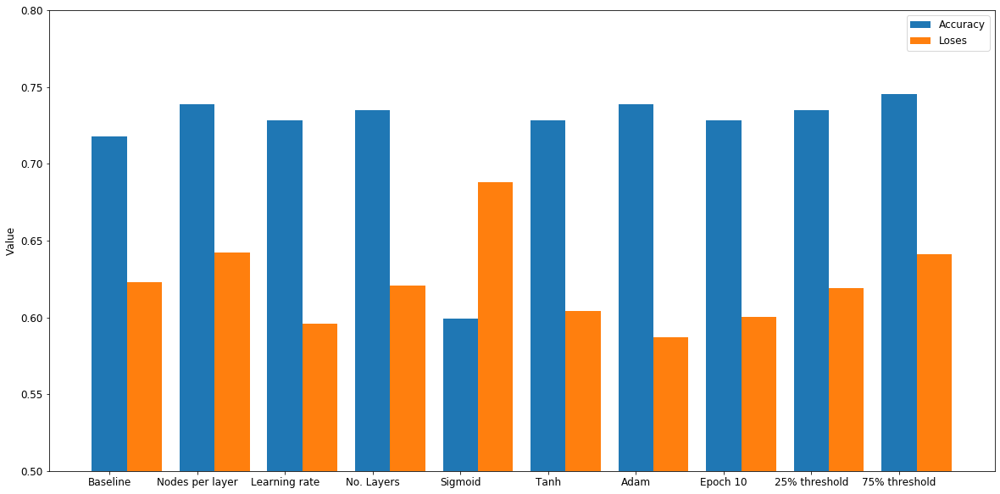

In [344]:
parameters_labels = ['Baseline', 'Nodes per layer', 'Learning rate', 'No. Layers', 'Sigmoid', 
                    'Tanh', 'Adam', 'Epoch 10', '25% threshold', '75% threshold', 
                    ]
model_accuracies = np.array(model_accuracies).flatten()
model_loses = np.array(model_loses).flatten()

width = 0.4
xticks = np.arange(len(parameters_labels))
f, ax = plt.subplots(1, figsize=(20,10))
ax.bar(xticks, model_accuracies, width)
ax.bar(xticks+width, model_loses, width)
ax.set_xticks(xticks)
ax.set_xticklabels(parameters_labels)
ax.set_ylabel('Value')
ax.set_ylim(bottom=0.5, top=0.8)
plt.legend(['Accuracy', 'Loses'])
plt.show()

In [345]:
model_accuracies

array([0.71777004, 0.73867595, 0.72822303, 0.73519164, 0.59930313,
       0.72822303, 0.73867595, 0.72822303, 0.73519164, 0.74564463])

# Trying Convolutional Neural Networks

In [346]:
cnn_x_train = nn_x_train.to_numpy()
cnn_x_train.reshape(334, 7, 1, 1)
cnn_x_train

array([[1., 1., 1., ..., 0., 1., 2.],
       [0., 1., 2., ..., 0., 1., 2.],
       [0., 1., 2., ..., 2., 1., 0.],
       ...,
       [0., 0., 2., ..., 1., 1., 1.],
       [0., 0., 2., ..., 2., 1., 0.],
       [0., 0., 3., ..., 2., 1., 0.]])

In [347]:
cnn_model2 = keras.models.Sequential([
    keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(334,7, 1)),
    keras.layers.MaxPooling2D(2,2),
    keras.layers.Conv2D(64, (3,3), activation='relu'),
    keras.layers.MaxPooling2D(2,2),
    keras.layers.Flatten(input_shape=[7]),
    keras.layers.Dense(500, activation='relu'),
    keras.layers.Dense(200, activation='relu'),
    keras.layers.Dense(10, activation='softmax')
])
cnn_model.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.SGD(learning_rate=0.02),
              metrics=[keras.metrics.sparse_categorical_accuracy]
)
print(cnn_model.summary())

cnn_history = cnn_model.fit(nn_x_train, nn_y_train, epochs=30,
                    validation_data=(nn_x_valid, nn_y_valid)
)

model_accuracies_cnn = cnn_model.evaluate(nn_x_test, nn_y_test)[1]
model_loses_cnn = cnn_model.evaluate(nn_x_test, nn_y_test)[0]

ValueError: Exception encountered when calling layer "conv2d_1" (type Conv2D).

Negative dimension size caused by subtracting 3 from 2 for '{{node conv2d_1/Conv2D}} = Conv2D[T=DT_FLOAT, data_format="NHWC", dilations=[1, 1, 1, 1], explicit_paddings=[], padding="VALID", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true](Placeholder, conv2d_1/Conv2D/ReadVariableOp)' with input shapes: [?,166,2,64], [3,3,64,64].

Call arguments received:
  • inputs=tf.Tensor(shape=(None, 166, 2, 64), dtype=float32)